# Stage 1 — Optuna Hyperparameter Search (2000 Epochs, No Early Stopping)
Cross-dataset: CATSA (train/val) → EmpaticaE4 (test)  
Signal: HR @ 1 Hz, window=60, stride=10  
Objective: maximise val-F1 (NopPruner, 15 trials / model)  
Storage: SQLite (resumable)  
**Epochs**: 2000 | **Early Stopping**: disabled

In [1]:
import sys, warnings, json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import optuna
from optuna.samplers import TPESampler
from optuna.pruners import NopPruner

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)

torch.set_float32_matmul_precision('high')
torch.backends.cudnn.benchmark = True

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
USE_BF16 = torch.cuda.is_available()
print(f'Device: {DEVICE}  |  BF16: {USE_BF16}')

Device: cuda  |  BF16: True


/home/binghin2/miniconda3/envs/myenv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# ── Configuration ────────────────────────────────────────────────────────────
MODELS = [
    'TimeMixerPP', 'Medformer', 'TSLANet', 'ModernTCN',
    'CrossGNN', 'TimesNet', 'Mamba2', 'iTransformer', 'PatchTST', 'Chronos2', 'TransformerCNN',
]

SIGNAL     = 'HR'
FS         = 1
WIN_SEC    = 60
STRIDE_SEC = 10
W          = FS * WIN_SEC
STRIDE     = FS * STRIDE_SEC
N_CHANNELS = 1
TASKS        = ['Baseline', 'Logic', 'Nback', 'Stroop', 'Sudoku']
STRESS_TASKS = {'Logic', 'Nback', 'Stroop', 'Sudoku'}

VAL_RATIO = 0.10
EPOCHS    = 2000      # 30 → 2000
# Early stopping: disabled

N_TRIALS  = 15

HR_ROOT  = Path('/home/binghin2/Myproject/Dataset/CATSA')
SAVE_DIR = Path('Save_model_HR_2000epoch')
SAVE_DIR.mkdir(exist_ok=True)
DB_PATH  = SAVE_DIR / 'optuna_studies.db'
STORAGE  = f'sqlite:///{DB_PATH}'

print(f'W={W}, stride={STRIDE}, EPOCHS={EPOCHS}, save → {SAVE_DIR}')

W=60, stride=10, EPOCHS=2000, save → Save_model_HR_2000epoch


In [3]:
# ── Data utilities ───────────────────────────────────────────────────────────
import re

def discover_subjects(root: Path) -> list[Path]:
    return sorted([p for p in root.iterdir() if p.is_dir() and re.match(r'Sub\d+', p.name)])

def read_hr(path: Path) -> np.ndarray:
    df = pd.read_csv(path)
    numeric_cols = [c for c in df.columns if pd.api.types.is_numeric_dtype(df[c])]
    if numeric_cols:
        values = df[numeric_cols[0]].to_numpy(np.float32)
    else:
        values = pd.to_numeric(df.iloc[:, 0], errors='coerce').to_numpy(np.float32)
    return values[~np.isnan(values)]

def make_windows(sig: np.ndarray, lbl: np.ndarray,
                 w: int, stride: int) -> tuple[np.ndarray, np.ndarray]:
    xs, ys = [], []
    for start in range(0, len(sig) - w + 1, stride):
        xs.append(sig[start:start + w])
        ys.append(int(lbl[start:start + w].mean() >= 0.5))
    return np.array(xs, dtype=np.float32), np.array(ys, dtype=np.int64)

def make_windows_1d(sig: np.ndarray, w: int, stride: int) -> np.ndarray:
    if len(sig) < w:
        return np.empty((0, 1, w), np.float32)
    return np.asarray([sig[i:i + w] for i in range(0, len(sig) - w + 1, stride)], np.float32)[:, None, :]

def build_hr_arrays(root: Path, w: int, stride: int,
                    val_ratio: float = 0.10):
    xs, ys = [], []
    for sub in discover_subjects(root):
        try:
            path = root / sub
            all_v = np.concatenate([read_hr(path / task / 'HR.csv') for task in TASKS])
            mu = float(np.mean(all_v))
            sigma = float(np.std(all_v)) + 1e-8
            for task in TASKS:
                norm = (read_hr(path / task / 'HR.csv') - mu) / sigma
                x = make_windows_1d(norm, w, stride)
                if len(x):
                    xs.append(x)
                    ys.append(np.full(len(x), int(task in STRESS_TASKS), np.int64))
        except Exception:
            pass
    X = np.concatenate(xs)
    Y = np.concatenate(ys)
    split = max(1, int(len(X) * (1 - val_ratio)))
    return X[:split], Y[:split], X[split:], Y[split:]

print('Data utilities defined.')

Data utilities defined.


In [4]:
# ── E4 data loading (test only - never used for train/val) ───────────────────
E4_ROOT = Path('/home/binghin2/Myproject/Dataset/EmpaticaE4Stress/Subjects')
SUBJECTS_E4 = [f'subject_{i:02d}' for i in range(1, 7)]


def build_e4_labels(n: int, fs: int = FS):
    fixed_s = {
        'rest0': 180, 'task1': 600, 'rest1': 120, 'task2': 300,
        'rest2': 120, 'task3': 180, 'rest3': 120, 'rest4': 120,
        'task5': 60,  'rest5': 120,
    }
    total_fixed_s = sum(fixed_s.values())
    task4_s = max(0, n // fs - total_fixed_s)
    segs = [
        ('rest0', 180, 0), ('task1', 600, 1), ('rest1', 120, -1),
        ('task2', 300, 1), ('rest2', 120, -1), ('task3', 180, 1),
        ('rest3', 120, -1), ('task4', task4_s, 1), ('rest4', 120, -1),
        ('task5', 60, 1), ('rest5', 120, -1),
    ]
    labels = np.full(n, -1, dtype=np.int64)
    cur = 0
    for _, dur_s, lab in segs:
        if dur_s <= 0:
            continue
        end = min(cur + dur_s * fs, n)
        if end > cur:
            labels[cur:end] = lab
        cur = end
        if cur >= n:
            break
    return labels, int(task4_s)


def e4_windows(hr: np.ndarray, labels: np.ndarray, W: int, S: int):
    mask = labels >= 0
    mu    = float(np.mean(hr[mask])) if mask.any() else float(np.mean(hr))
    sigma = float(np.std(hr[mask])) + 1e-8 if mask.any() else float(np.std(hr)) + 1e-8
    norm = ((hr - mu) / sigma).astype(np.float32)
    xs, ys = [], []
    for i in range(0, len(norm) - W + 1, S):
        u = np.unique(labels[i:i + W])
        if len(u) == 1 and u[0] in (0, 1):
            xs.append(norm[i:i + W])
            ys.append(int(u[0]))
    if not xs:
        return np.empty((0, 1, W), np.float32), np.empty(0, np.int64)
    return np.asarray(xs, np.float32)[:, None, :], np.asarray(ys, np.int64)


e4_data_per_subject = {}
for sub in SUBJECTS_E4:
    hr = read_hr(E4_ROOT / sub / f'{SIGNAL}.csv')
    labels, _ = build_e4_labels(len(hr), fs=FS)
    x, y = e4_windows(hr, labels, W, STRIDE)
    e4_data_per_subject[sub] = (x, y)
    print(f'{sub}: {len(x)} windows')

subject_01: 158 windows
subject_02: 143 windows
subject_03: 115 windows
subject_04: 118 windows
subject_05: 116 windows
subject_06: 124 windows


In [5]:
# ── Load HR data (once, shared across all models) ─────────────────────────
print('Loading HR data...', end=' ')
x_train, y_train, x_val, y_val = build_hr_arrays(HR_ROOT, W, STRIDE, VAL_RATIO)
print(f'done.  train={x_train.shape}  val={x_val.shape}')

n_stress    = (y_train == 1).sum()
n_nonstress = (y_train == 0).sum()
POS_WEIGHT = float(n_stress / n_nonstress)
print(f'Stress={n_stress}, Non-stress={n_nonstress}, pos_weight={POS_WEIGHT:.3f}')


Loading HR data... done.  train=(2919, 1, 60)  val=(325, 1, 60)
Stress=2334, Non-stress=585, pos_weight=3.990


In [6]:
# ── Chronos-2 pipeline (optional) ────────────────────────────────────────────
chronos_pipeline = None
try:
    from chronos import ChronosPipeline
    chronos_pipeline = ChronosPipeline.from_pretrained(
        'amazon/chronos-t5-small',
        device_map=str(DEVICE),
        torch_dtype=torch.float32,
    )
    print('Chronos-2 pipeline loaded.')
except Exception as e:
    print(f'Chronos-2 unavailable: {e}')
    MODELS = [m for m in MODELS if m != 'Chronos2']
    print(f'Running without Chronos2. Models: {MODELS}')

Chronos-2 unavailable: Could not import module 'PreTrainedModel'. Are this object's requirements defined correctly?
Running without Chronos2. Models: ['TimeMixerPP', 'Medformer', 'TSLANet', 'ModernTCN', 'CrossGNN', 'TimesNet', 'Mamba2', 'iTransformer', 'PatchTST', 'TransformerCNN']


In [7]:
# ── Import models and shared utils ───────────────────────────────────────────
sys.path.insert(0, str(Path('.').resolve()))

from HR_optuna_utils import (
    evaluate_on_e4, finalize_best_checkpoint,
    sample_hp, set_seed, seed_worker,
    generate_stage1_summary, save_per_subject_results,
    plot_stage1_comparison, plot_per_subject_heatmap, save_hp_importance_plots,
)
from HR_models_ten import build_model

_ = build_model('TimeMixerPP', W=W, n_channels=N_CHANNELS)
print('HR_models_ten.py imported OK.')


HR_models_ten.py imported OK.


In [8]:
# ── Per-trial utilities: val metrics + objective (ES + BCEWithLogitsLoss) ────

@torch.no_grad()
def _val_metrics(model, loader, criterion, use_bf16, device):
    """Returns (val_loss, val_acc, val_f1)."""
    model.eval()
    total_loss = 0.0
    n_batches  = 0
    all_pred, all_true = [], []
    for xb, yb in loader:
        xb    = xb.to(device, non_blocking=True)
        yb_d  = yb.to(device, non_blocking=True)
        if use_bf16:
            with torch.autocast('cuda', dtype=torch.bfloat16):
                logits = model(xb)
                loss   = criterion(logits, yb_d.float())
        else:
            logits = model(xb)
            loss   = criterion(logits, yb_d.float())
        total_loss += loss.item()
        n_batches  += 1
        preds = (logits.float().sigmoid() >= 0.5).long().cpu()
        all_pred.append(preds)
        all_true.append(yb)
    y_pred = torch.cat(all_pred).numpy()
    y_true = torch.cat(all_true).numpy()
    val_loss = total_loss / max(n_batches, 1)
    val_acc  = float((y_pred == y_true).mean())
    tp  = int(((y_pred == 1) & (y_true == 1)).sum())
    fp  = int(((y_pred == 1) & (y_true == 0)).sum())
    fn  = int(((y_pred == 0) & (y_true == 1)).sum())
    prec   = tp / (tp + fp + 1e-8)
    rec    = tp / (tp + fn + 1e-8)
    val_f1 = float(2 * prec * rec / (prec + rec + 1e-8))
    return val_loss, val_acc, val_f1


def make_objective_2000(
    model_name, x_train, y_train, x_val, y_val,
    W, n_channels, pos_weight, device, save_dir,
    epochs=2000, chronos_pipeline=None,
):
    """
    Objective with early stopping (patience from Optuna) + BCEWithLogitsLoss(pos_weight).
    Returns (objective, best_f1_ref, best_hp_ref, trial_histories)
    """
    save_dir   = Path(save_dir)
    is_chronos = (model_name == 'Chronos2')
    use_bf16   = (not is_chronos) and torch.cuda.is_available()

    best_f1_ref: list[float] = [-1.0]
    best_hp_ref: list[dict]  = [{}]
    trial_histories: dict    = {}

    tmp_dir = save_dir / 'tmp_checkpoints' / model_name
    tmp_dir.mkdir(parents=True, exist_ok=True)

    xt = torch.from_numpy(x_train).float()
    yt = torch.from_numpy(y_train).long()
    xv = torch.from_numpy(x_val).float()
    yv = torch.from_numpy(y_val).long()
    val_ds = TensorDataset(xv, yv)

    def objective(trial: optuna.Trial) -> float:
        set_seed(42)
        hp       = sample_hp(trial, model_name)
        bs       = int(hp.pop('bs'))
        lr       = float(hp.pop('lr'))
        wd       = float(hp.pop('wd'))
        patience = int(hp.pop('patience'))

        g = torch.Generator()
        g.manual_seed(42)
        train_ds     = TensorDataset(xt, yt)
        train_loader = DataLoader(train_ds, batch_size=bs, shuffle=True,
                                  num_workers=2, pin_memory=True, drop_last=True,
                                  worker_init_fn=seed_worker, generator=g)
        val_loader   = DataLoader(val_ds,   batch_size=bs, shuffle=False,
                                  num_workers=2, pin_memory=True,
                                  worker_init_fn=seed_worker, generator=g)

        if is_chronos:
            if chronos_pipeline is None:
                raise optuna.TrialPruned()
            model = build_model(model_name, W=W, n_channels=n_channels,
                                pipeline=chronos_pipeline, **hp)
            enc_params, head_params = [], []
            for n, p in model.named_parameters():
                if p.requires_grad:
                    (enc_params if 'head' not in n else head_params).append(p)
            optimizer = torch.optim.AdamW([
                {'params': enc_params,  'lr': lr * 0.1},
                {'params': head_params, 'lr': lr},
            ], weight_decay=wd)
        else:
            model     = build_model(model_name, W=W, n_channels=n_channels, **hp)
            optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)

        model     = model.to(device)
        pw        = torch.tensor([pos_weight], dtype=torch.float32, device=device)
        criterion = nn.BCEWithLogitsLoss(pos_weight=pw)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=epochs, eta_min=lr * 0.01)

        best_f1    = -1.0
        no_improve = 0
        ckpt_path  = tmp_dir / f'trial_{trial.number}.pt'
        trial_histories[trial.number] = {'train_loss': [], 'val_loss': [], 'val_acc': []}

        for epoch in range(epochs):
            # ── train ──
            model.train()
            epoch_loss = 0.0
            n_batches  = 0
            for xb, yb in train_loader:
                xb = xb.to(device, non_blocking=True)
                yb = yb.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                if use_bf16:
                    with torch.autocast('cuda', dtype=torch.bfloat16):
                        loss = criterion(model(xb), yb.float())
                else:
                    loss = criterion(model(xb), yb.float())
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                epoch_loss += loss.item()
                n_batches  += 1
            scheduler.step()

            train_loss_ep = epoch_loss / max(n_batches, 1)

            # ── validate ──
            val_loss_ep, val_acc_ep, val_f1_ep = _val_metrics(
                model, val_loader, criterion,
                use_bf16 and not is_chronos, device)

            trial_histories[trial.number]['train_loss'].append(train_loss_ep)
            trial_histories[trial.number]['val_loss'].append(val_loss_ep)
            trial_histories[trial.number]['val_acc'].append(val_acc_ep)

            trial.report(val_f1_ep, epoch)

            if val_f1_ep > best_f1:
                best_f1    = val_f1_ep
                no_improve = 0
                torch.save({
                    'model_state_dict': model.state_dict(),
                    'hp': {**hp, 'lr': lr, 'wd': wd, 'bs': bs, 'patience': patience},
                    'epoch': epoch,
                    'val_f1': val_f1_ep,
                    'trial_number': trial.number,
                    'model_name': model_name,
                }, ckpt_path)
            else:
                no_improve += 1
                if no_improve >= patience:
                    break

        if best_f1 > best_f1_ref[0]:
            best_f1_ref[0] = best_f1
            best_hp_ref[0] = {**hp, 'lr': lr, 'wd': wd, 'bs': bs, 'patience': patience}

        del model
        torch.cuda.empty_cache()
        return best_f1

    return objective, best_f1_ref, best_hp_ref, trial_histories


def make_callbacks(model_name: str, trial_histories: dict):
    """Progress log + per-trial loss/accuracy plot."""
    def callback(study: optuna.Study, trial: optuna.Trial):
        n_done   = len([t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE])
        n_pruned = len([t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED])
        best_val = study.best_value if study.best_trial is not None else float('nan')
        val_str  = f'{trial.value:.4f}' if trial.value is not None else 'pruned'
        print(f'  [{model_name}] trial {trial.number:>2d} ({trial.state.name:<9s}) '
              f'val_f1={val_str}  best={best_val:.4f}  '
              f'(done={n_done}, pruned={n_pruned})')

        history      = trial_histories.get(trial.number, {})
        train_losses = history.get('train_loss', [])
        val_losses   = history.get('val_loss',   [])
        val_accs     = history.get('val_acc',    [])

        if not train_losses:
            return

        ep = range(1, len(train_losses) + 1)
        fig, ax1 = plt.subplots(figsize=(13, 4))

        ax1.plot(ep, train_losses, color='steelblue', linewidth=1.2, label='Train Loss')
        ax1.plot(ep, val_losses,   color='tomato',    linewidth=1.2, label='Val Loss')
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Loss')
        ax1.legend(loc='upper left')
        ax1.grid(True, alpha=0.3)

        ax2 = ax1.twinx()
        ax2.plot(ep, val_accs, color='seagreen', linewidth=1.2,
                 linestyle='--', label='Val Accuracy')
        ax2.set_ylabel('Accuracy', color='seagreen')
        ax2.tick_params(axis='y', labelcolor='seagreen')
        ax2.set_ylim(0, 1.05)
        ax2.legend(loc='upper right')

        title = f'{model_name}  Trial {trial.number}'
        if trial.value is not None:
            title += f'  |  best val_f1 = {trial.value:.4f}'
        ax1.set_title(title)

        plt.tight_layout()
        plt.show()

    return callback


print('_val_metrics / make_objective_2000 / make_callbacks defined.')


_val_metrics / make_objective_2000 / make_callbacks defined.



 Model: TimeMixerPP   study: stage1_ES_CW_TimeMixerPP
  Resuming from trial 0, running 15 more.
  [TimeMixerPP] trial  0 (COMPLETE ) val_f1=0.8955  best=0.8955  (done=1, pruned=0)


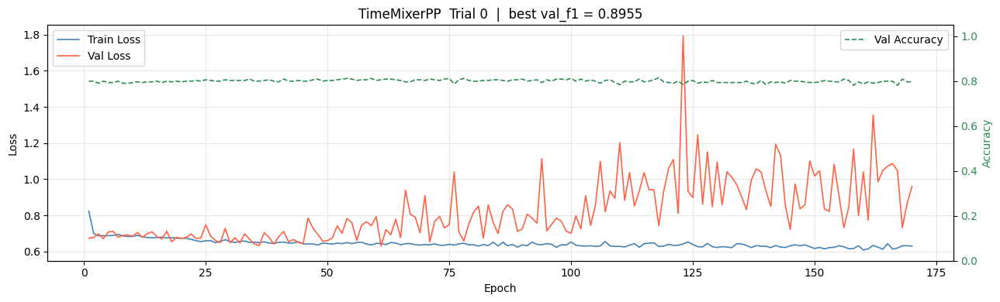

  [TimeMixerPP] trial  1 (COMPLETE ) val_f1=0.8889  best=0.8955  (done=2, pruned=0)


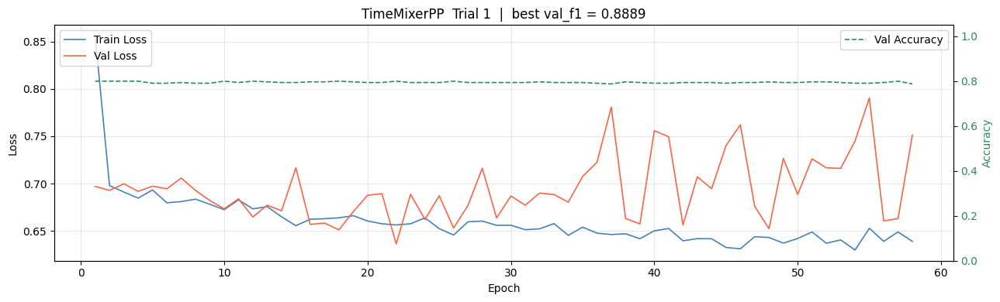

  [TimeMixerPP] trial  2 (COMPLETE ) val_f1=0.8950  best=0.8955  (done=3, pruned=0)


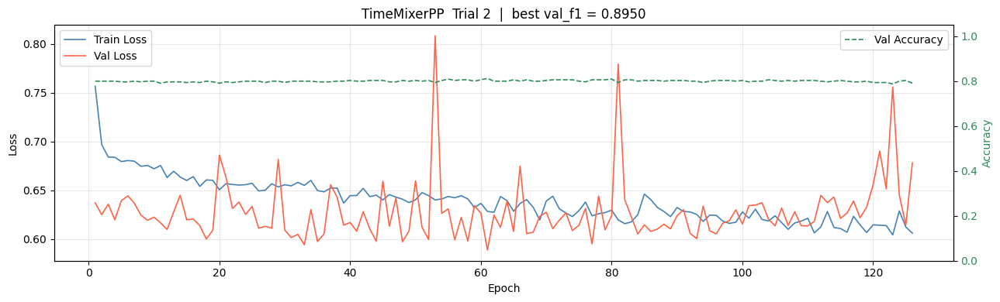

  [TimeMixerPP] trial  3 (COMPLETE ) val_f1=0.9005  best=0.9005  (done=4, pruned=0)


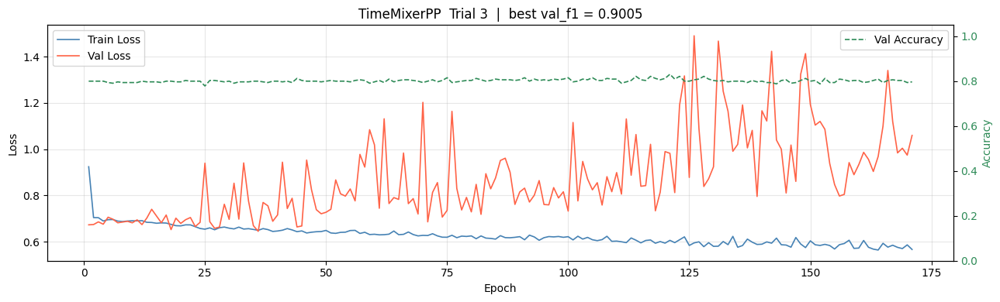

  [TimeMixerPP] trial  4 (COMPLETE ) val_f1=0.8966  best=0.9005  (done=5, pruned=0)


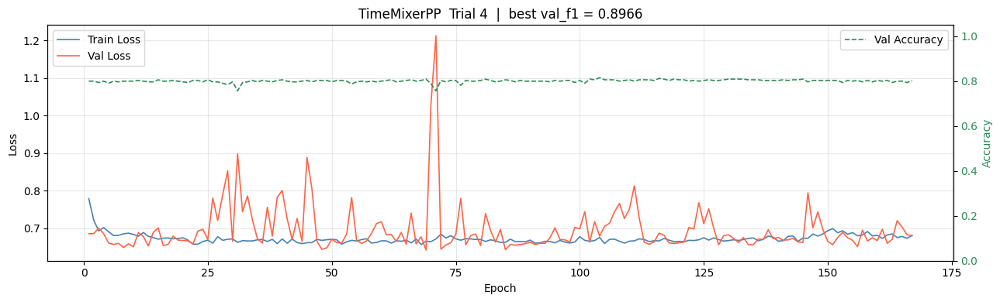

  [TimeMixerPP] trial  5 (COMPLETE ) val_f1=0.8889  best=0.9005  (done=6, pruned=0)


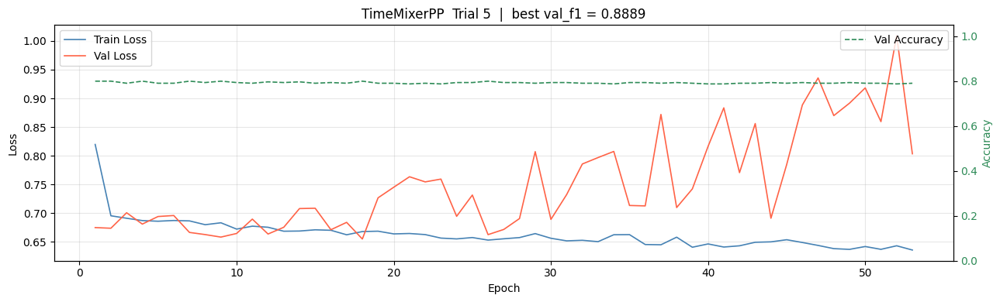

  [TimeMixerPP] trial  6 (COMPLETE ) val_f1=0.9005  best=0.9005  (done=7, pruned=0)


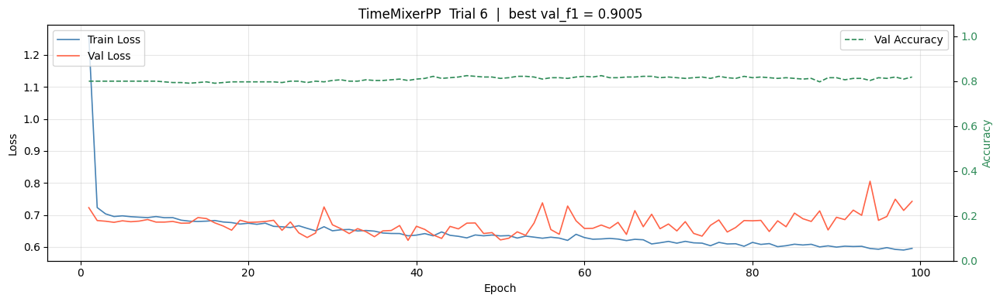

  [TimeMixerPP] trial  7 (COMPLETE ) val_f1=0.8916  best=0.9005  (done=8, pruned=0)


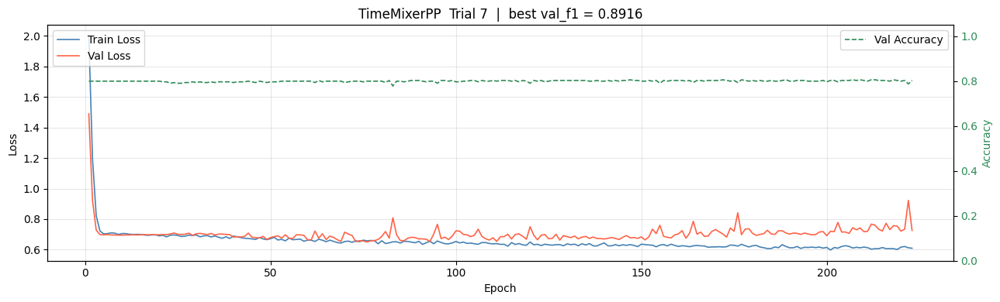

  [TimeMixerPP] trial  8 (COMPLETE ) val_f1=0.8966  best=0.9005  (done=9, pruned=0)


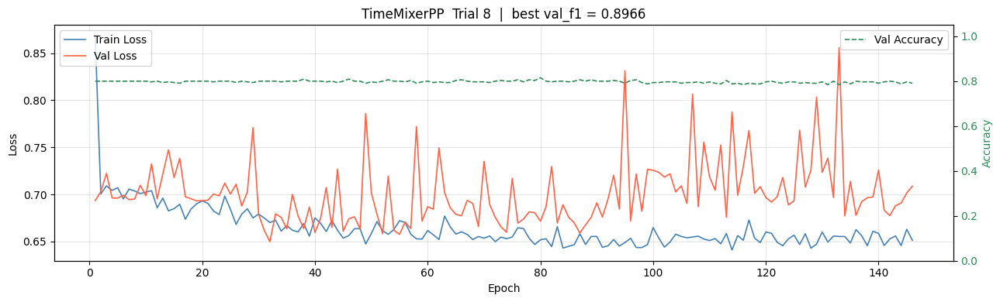

  [TimeMixerPP] trial  9 (COMPLETE ) val_f1=0.8955  best=0.9005  (done=10, pruned=0)


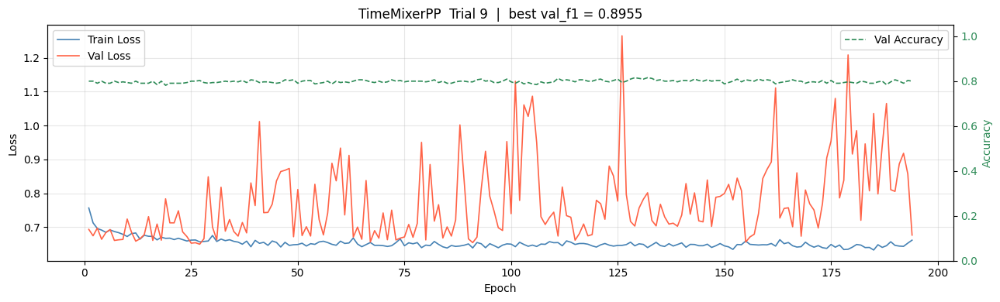

  [TimeMixerPP] trial 10 (COMPLETE ) val_f1=0.8889  best=0.9005  (done=11, pruned=0)


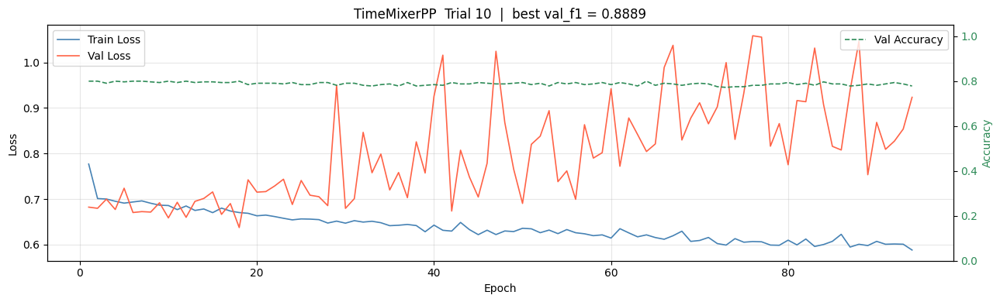

  [TimeMixerPP] trial 11 (COMPLETE ) val_f1=0.8964  best=0.9005  (done=12, pruned=0)


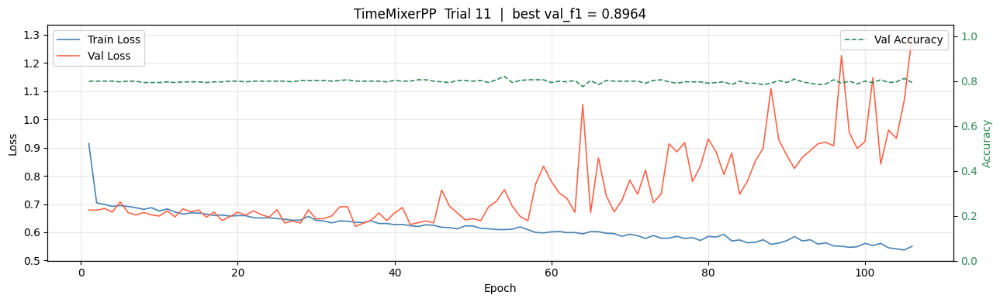

  [TimeMixerPP] trial 12 (COMPLETE ) val_f1=0.8990  best=0.9005  (done=13, pruned=0)


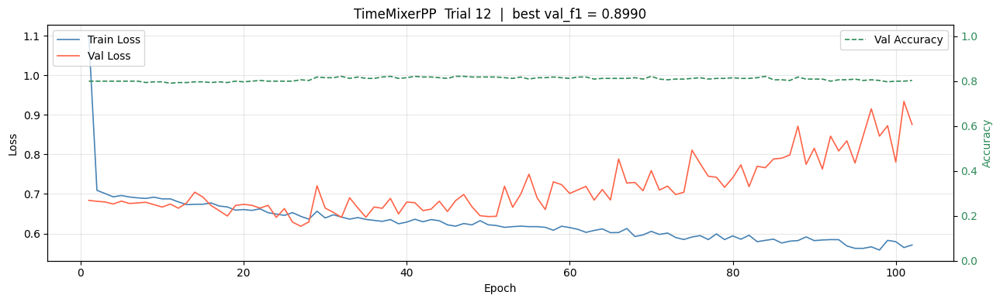

  [TimeMixerPP] trial 13 (COMPLETE ) val_f1=0.8943  best=0.9005  (done=14, pruned=0)


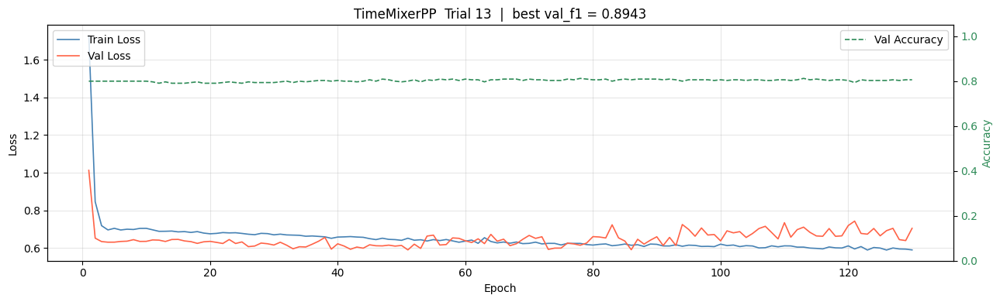

  [TimeMixerPP] trial 14 (COMPLETE ) val_f1=0.8889  best=0.9005  (done=15, pruned=0)


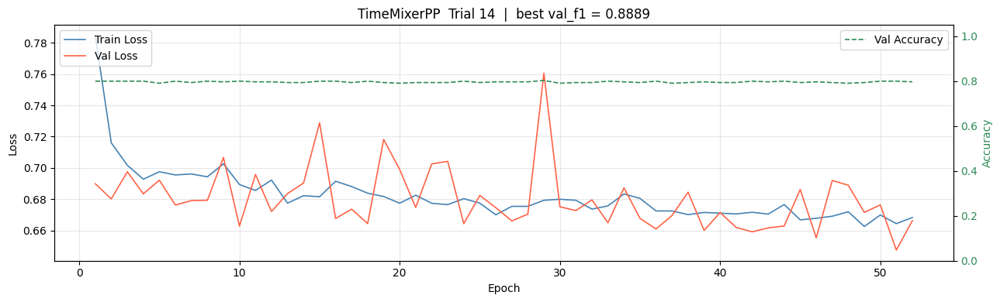

  Best: trial 3  val_f1=0.9005
  Params: {'lr': 0.0004436887522576522, 'wd': 0.0024750668315309016, 'dropout': 0.3764520033235285, 'bs': 32, 'patience': 50, 'd_model': 64, 'n_blocks': 1, 'k_periods': 4, 'n_heads': 8}
  E4 Overall F1: 0.9136

 Model: Medformer   study: stage1_ES_CW_Medformer
  Resuming from trial 0, running 15 more.
  [Medformer] trial  0 (COMPLETE ) val_f1=0.8958  best=0.8958  (done=1, pruned=0)


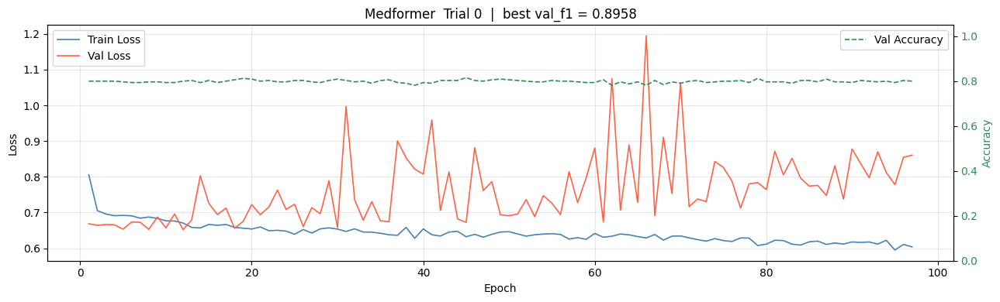

  [Medformer] trial  1 (COMPLETE ) val_f1=0.8919  best=0.8958  (done=2, pruned=0)


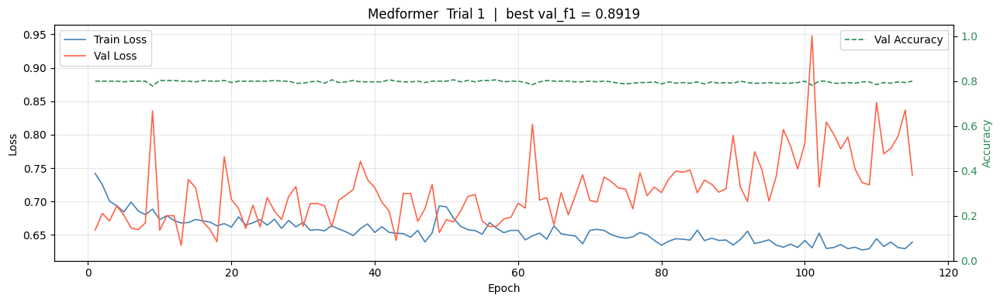

  [Medformer] trial  2 (COMPLETE ) val_f1=0.8966  best=0.8966  (done=3, pruned=0)


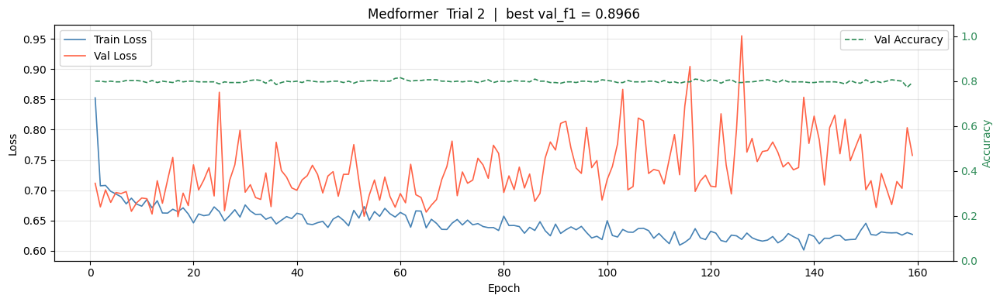

  [Medformer] trial  3 (COMPLETE ) val_f1=0.8946  best=0.8966  (done=4, pruned=0)


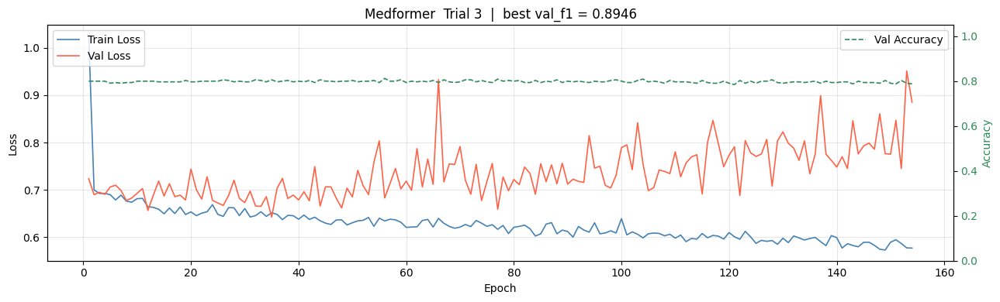

  [Medformer] trial  4 (COMPLETE ) val_f1=0.8931  best=0.8966  (done=5, pruned=0)


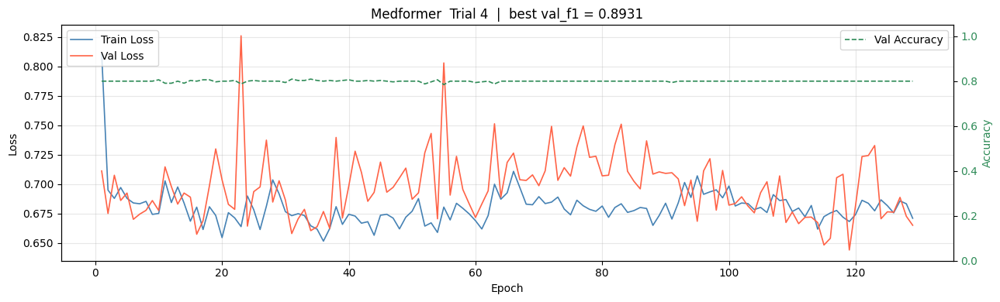

  [Medformer] trial  5 (COMPLETE ) val_f1=0.8935  best=0.8966  (done=6, pruned=0)


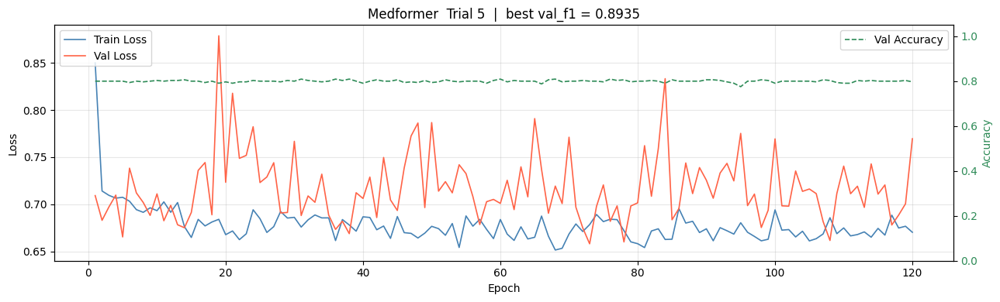

  [Medformer] trial  6 (COMPLETE ) val_f1=0.8889  best=0.8966  (done=7, pruned=0)


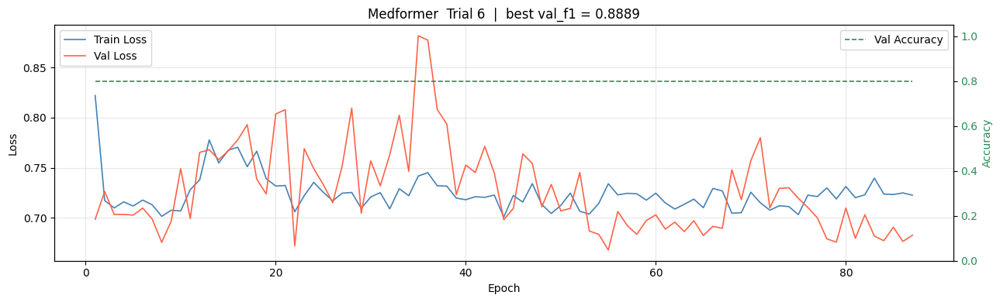

  [Medformer] trial  7 (COMPLETE ) val_f1=0.8946  best=0.8966  (done=8, pruned=0)


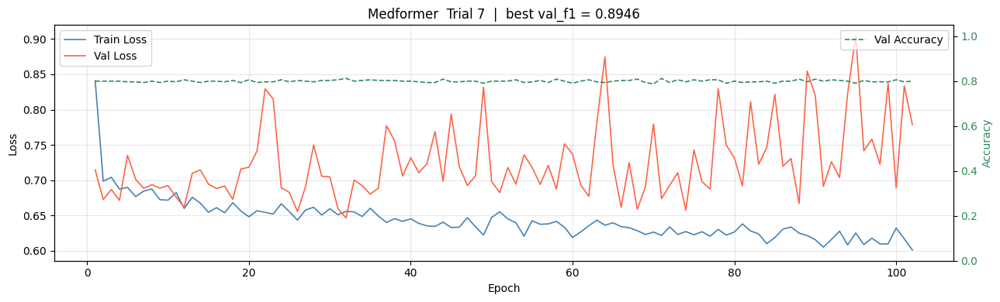

  [Medformer] trial  8 (COMPLETE ) val_f1=0.8935  best=0.8966  (done=9, pruned=0)


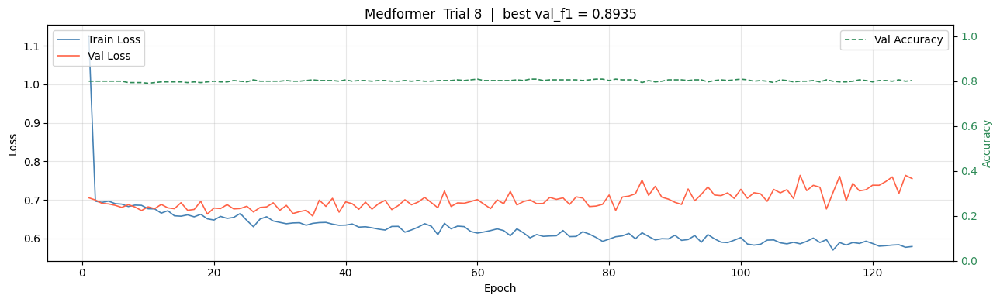

  [Medformer] trial  9 (COMPLETE ) val_f1=0.8889  best=0.8966  (done=10, pruned=0)


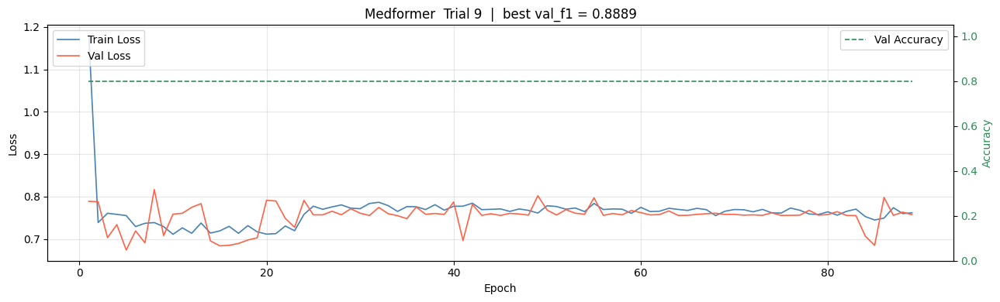

  [Medformer] trial 10 (COMPLETE ) val_f1=0.8889  best=0.8966  (done=11, pruned=0)


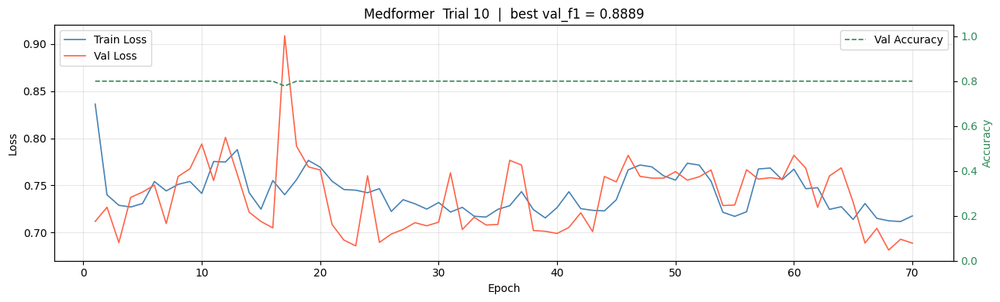

  [Medformer] trial 11 (COMPLETE ) val_f1=0.8912  best=0.8966  (done=12, pruned=0)


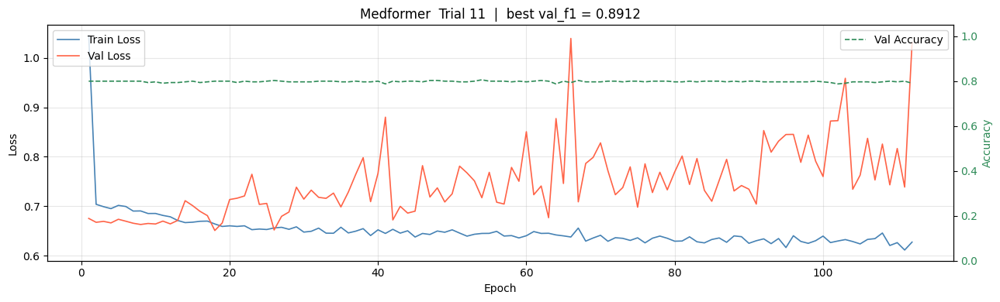

  [Medformer] trial 12 (COMPLETE ) val_f1=0.8927  best=0.8966  (done=13, pruned=0)


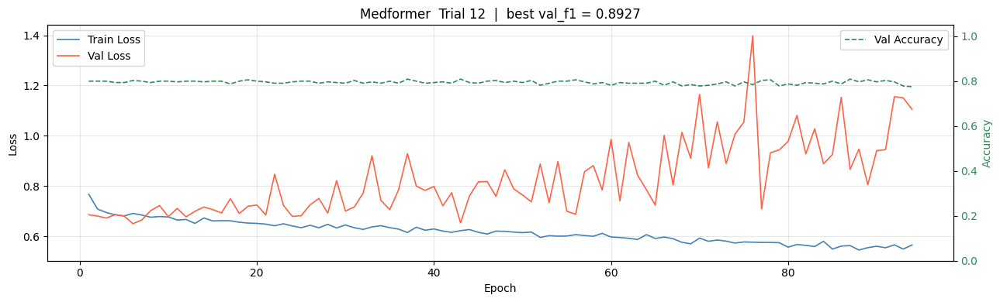

  [Medformer] trial 13 (COMPLETE ) val_f1=0.8931  best=0.8966  (done=14, pruned=0)


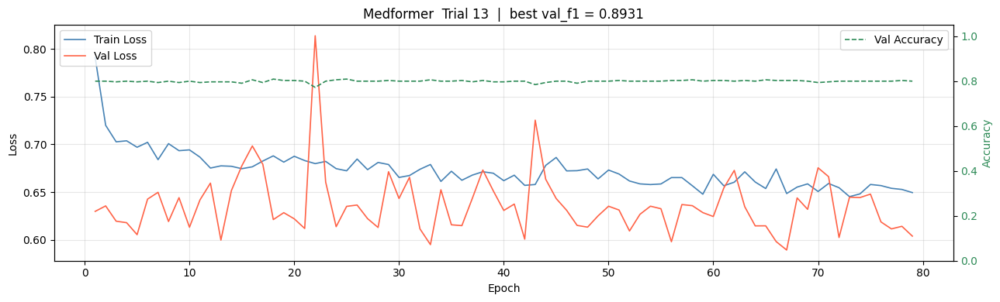

  [Medformer] trial 14 (COMPLETE ) val_f1=0.8893  best=0.8966  (done=15, pruned=0)


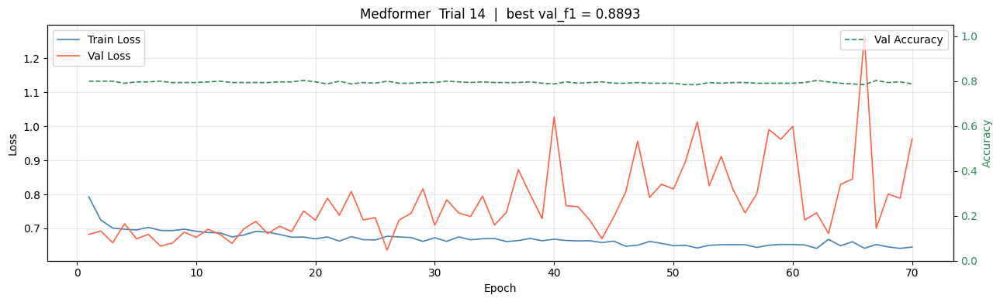

  Best: trial 2  val_f1=0.8966
  Params: {'lr': 0.0015304852121831463, 'wd': 1.3783237455007187e-05, 'dropout': 0.24301794076057537, 'bs': 128, 'patience': 99, 'd_model': 64, 'n_heads': 2, 'n_layers': 2}
  E4 Overall F1: 0.9416

 Model: TSLANet   study: stage1_ES_CW_TSLANet
  Resuming from trial 0, running 15 more.
  [TSLANet] trial  0 (COMPLETE ) val_f1=0.8889  best=0.8889  (done=1, pruned=0)


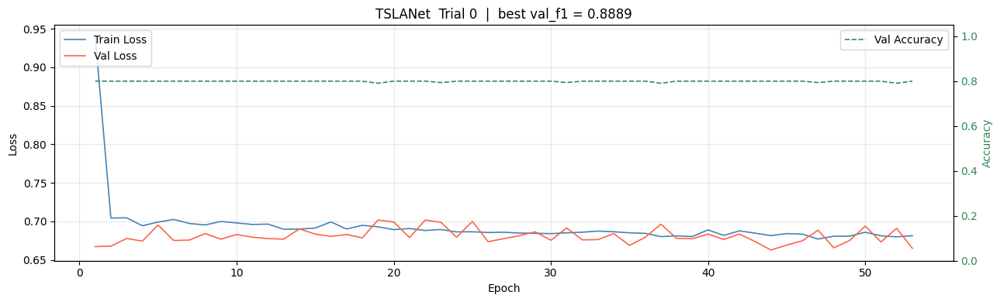

  [TSLANet] trial  1 (COMPLETE ) val_f1=0.8904  best=0.8904  (done=2, pruned=0)


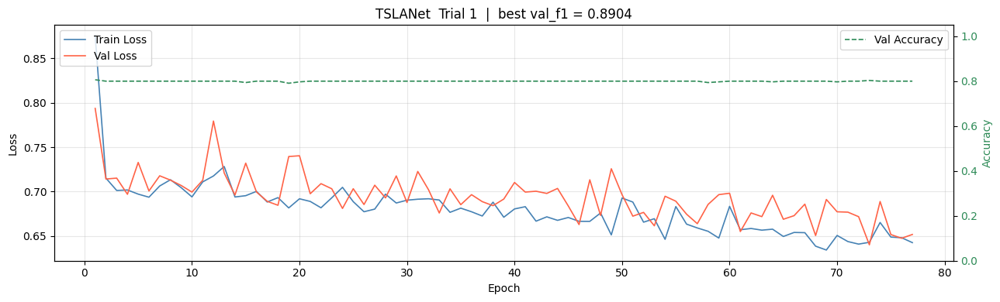

  [TSLANet] trial  2 (COMPLETE ) val_f1=0.9027  best=0.9027  (done=3, pruned=0)


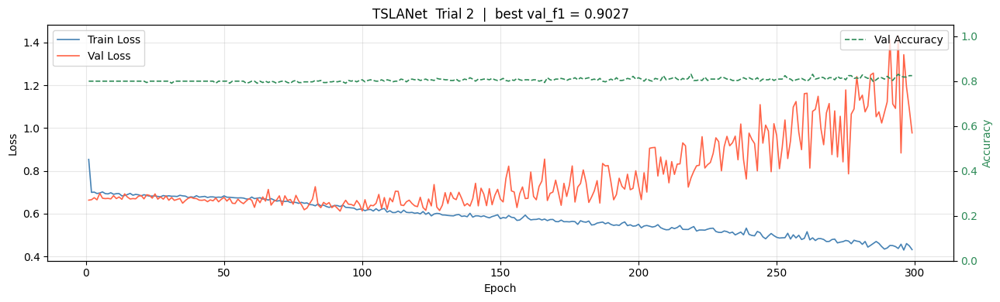

  [TSLANet] trial  3 (COMPLETE ) val_f1=0.8889  best=0.9027  (done=4, pruned=0)


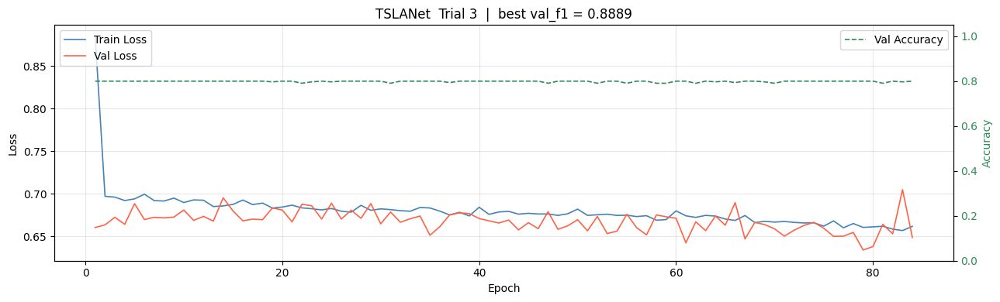

  [TSLANet] trial  4 (COMPLETE ) val_f1=0.9002  best=0.9027  (done=5, pruned=0)


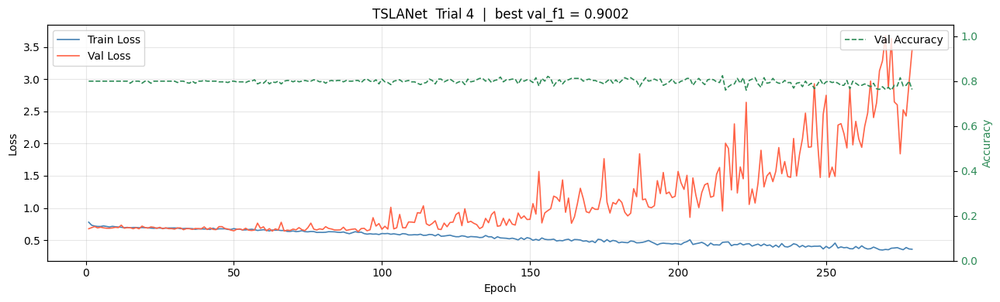

  [TSLANet] trial  5 (COMPLETE ) val_f1=0.8974  best=0.9027  (done=6, pruned=0)


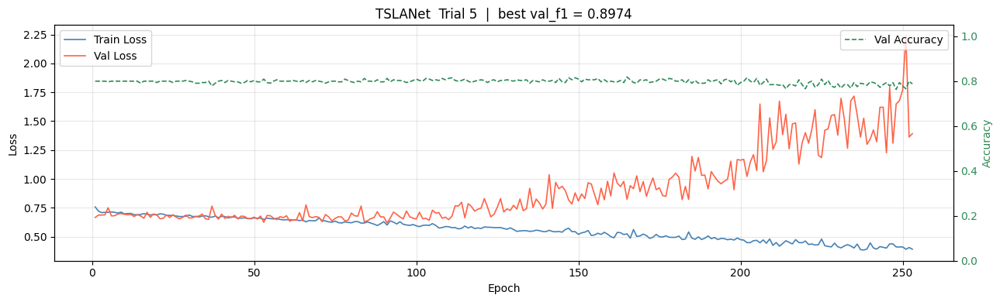

  [TSLANet] trial  6 (COMPLETE ) val_f1=0.8997  best=0.9027  (done=7, pruned=0)


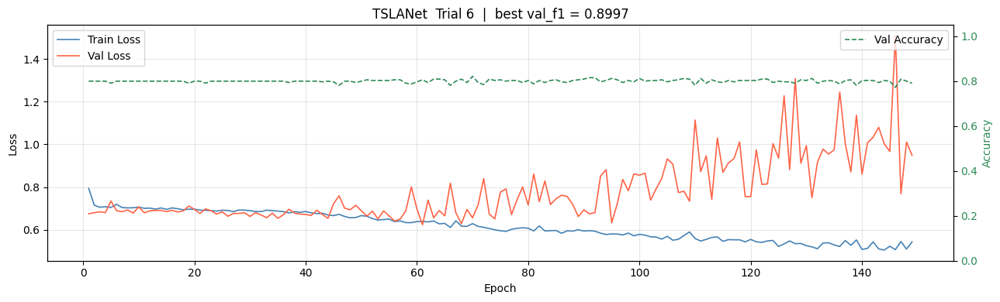

  [TSLANet] trial  7 (COMPLETE ) val_f1=0.8889  best=0.9027  (done=8, pruned=0)


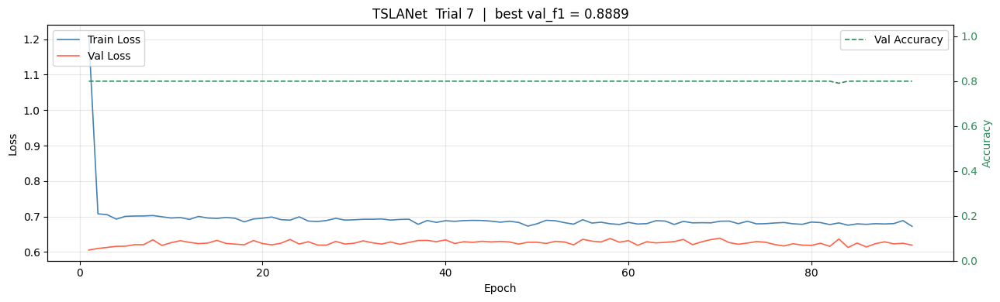

  [TSLANet] trial  8 (COMPLETE ) val_f1=0.8889  best=0.9027  (done=9, pruned=0)


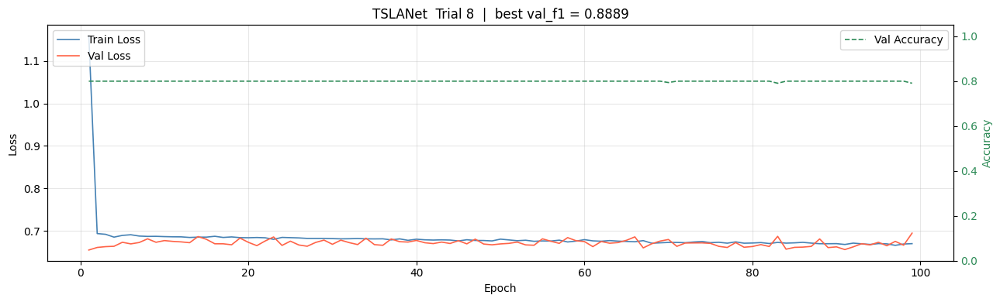

  [TSLANet] trial  9 (COMPLETE ) val_f1=0.8889  best=0.9027  (done=10, pruned=0)


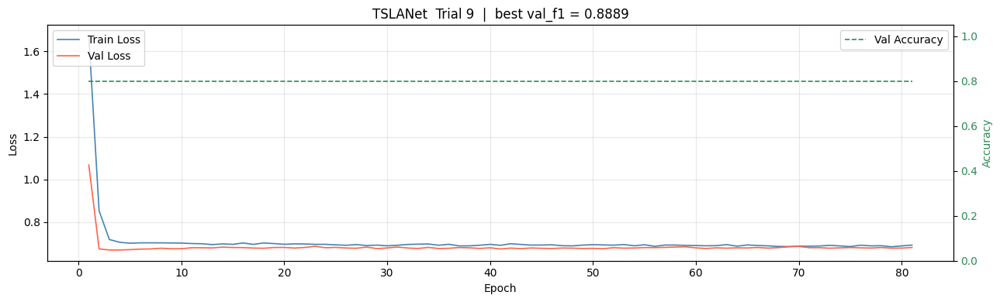

  [TSLANet] trial 10 (COMPLETE ) val_f1=0.8889  best=0.9027  (done=11, pruned=0)


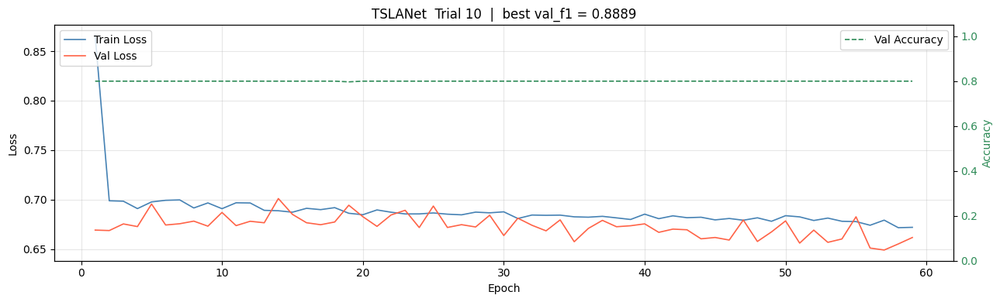

  [TSLANet] trial 11 (COMPLETE ) val_f1=0.9005  best=0.9027  (done=12, pruned=0)


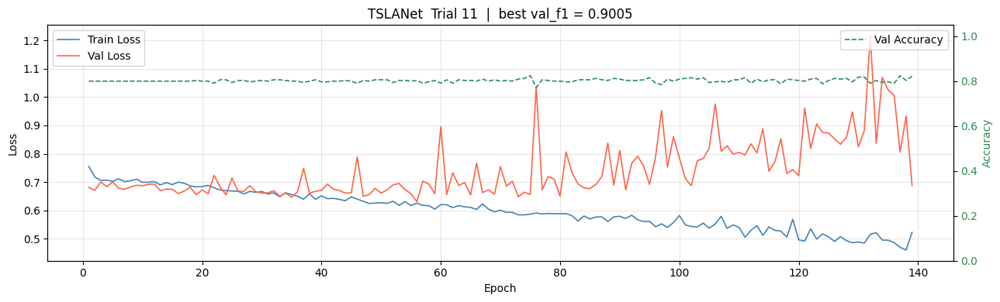

  [TSLANet] trial 12 (COMPLETE ) val_f1=0.8958  best=0.9027  (done=13, pruned=0)


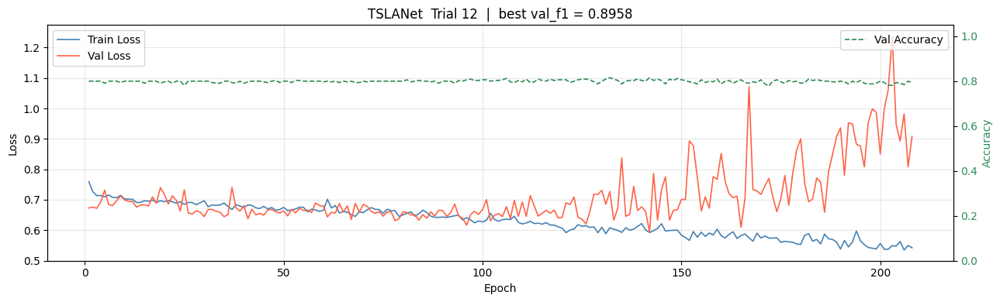

  [TSLANet] trial 13 (COMPLETE ) val_f1=0.8977  best=0.9027  (done=14, pruned=0)


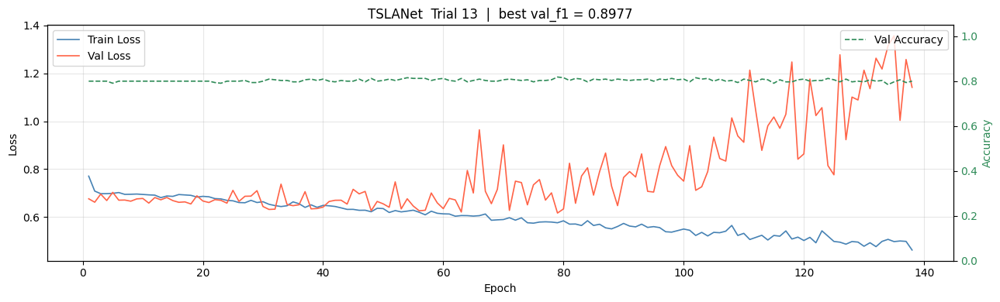

  [TSLANet] trial 14 (COMPLETE ) val_f1=0.9072  best=0.9072  (done=15, pruned=0)


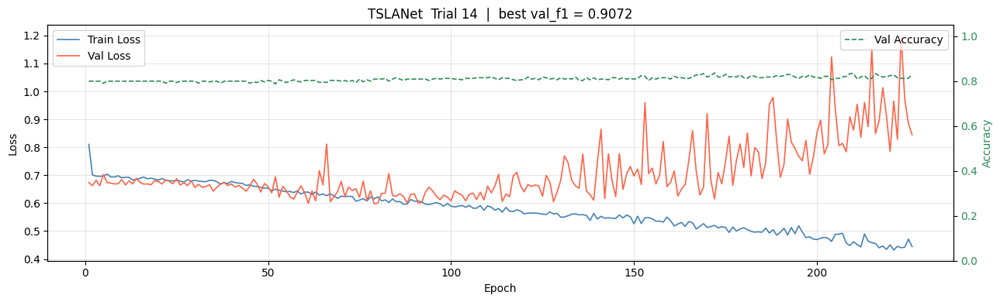

  Best: trial 14  val_f1=0.9072
  Params: {'lr': 0.0005606991660912626, 'wd': 1.012850700245791e-05, 'dropout': 0.1593633996340482, 'bs': 32, 'patience': 54, 'd_model': 128, 'n_blocks': 1}
  E4 Overall F1: 0.9346

 Model: ModernTCN   study: stage1_ES_CW_ModernTCN
  Resuming from trial 0, running 15 more.
  [ModernTCN] trial  0 (COMPLETE ) val_f1=0.8931  best=0.8931  (done=1, pruned=0)


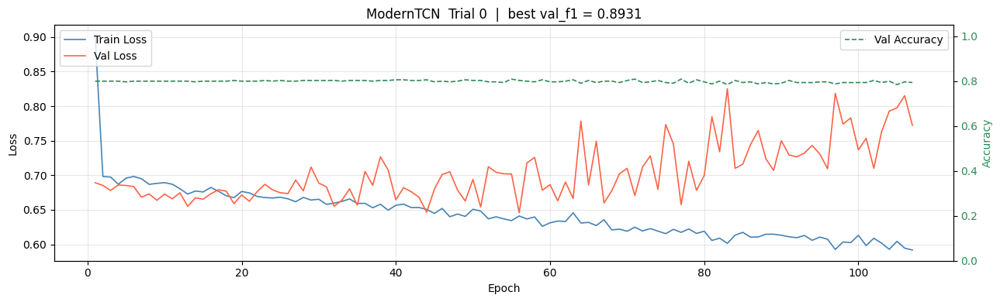

  [ModernTCN] trial  1 (COMPLETE ) val_f1=0.8912  best=0.8931  (done=2, pruned=0)


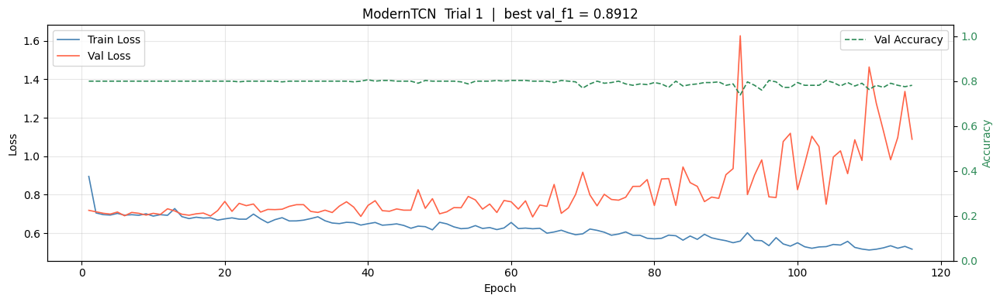

  [ModernTCN] trial  2 (COMPLETE ) val_f1=0.8977  best=0.8977  (done=3, pruned=0)


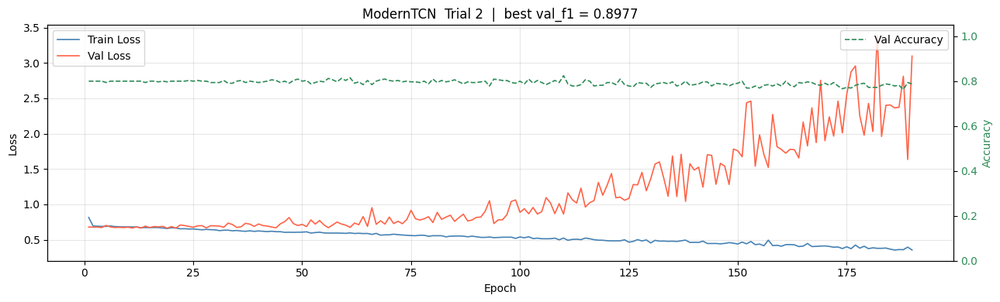

  [ModernTCN] trial  3 (COMPLETE ) val_f1=0.9029  best=0.9029  (done=4, pruned=0)


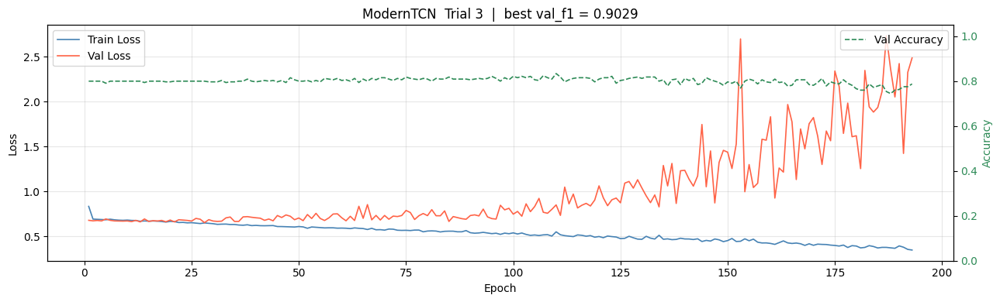

  [ModernTCN] trial  4 (COMPLETE ) val_f1=0.8931  best=0.9029  (done=5, pruned=0)


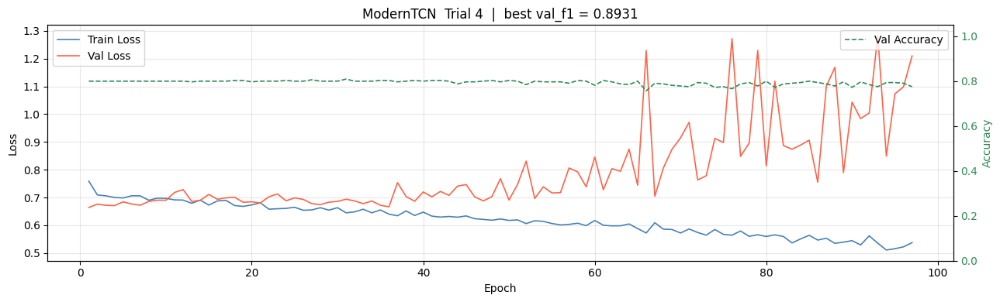

  [ModernTCN] trial  5 (COMPLETE ) val_f1=0.8916  best=0.9029  (done=6, pruned=0)


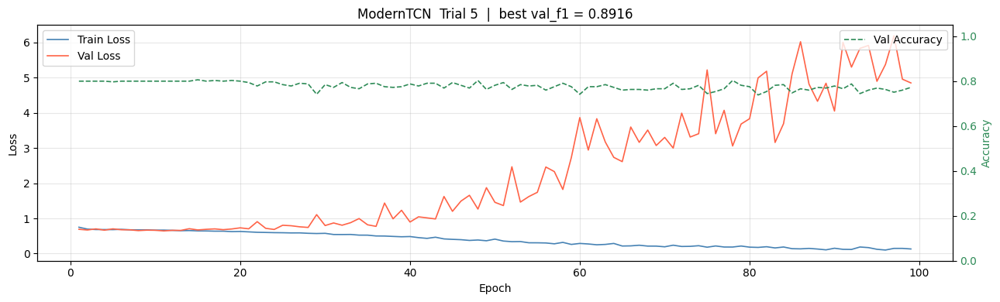

  [ModernTCN] trial  6 (COMPLETE ) val_f1=0.8995  best=0.9029  (done=7, pruned=0)


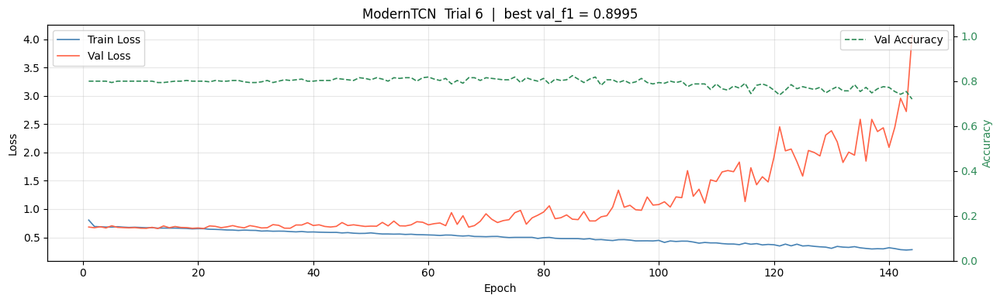

  [ModernTCN] trial  7 (COMPLETE ) val_f1=0.8889  best=0.9029  (done=8, pruned=0)


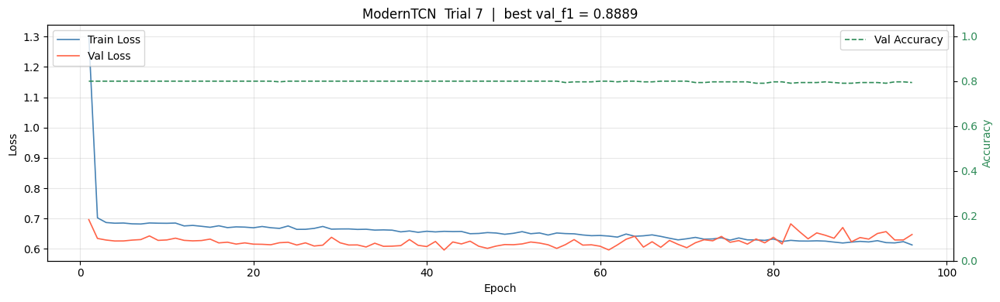

  [ModernTCN] trial  8 (COMPLETE ) val_f1=0.8940  best=0.9029  (done=9, pruned=0)


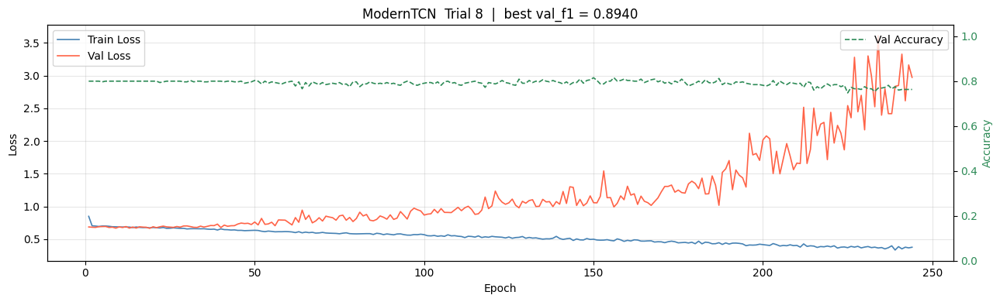

  [ModernTCN] trial  9 (COMPLETE ) val_f1=0.8966  best=0.9029  (done=10, pruned=0)


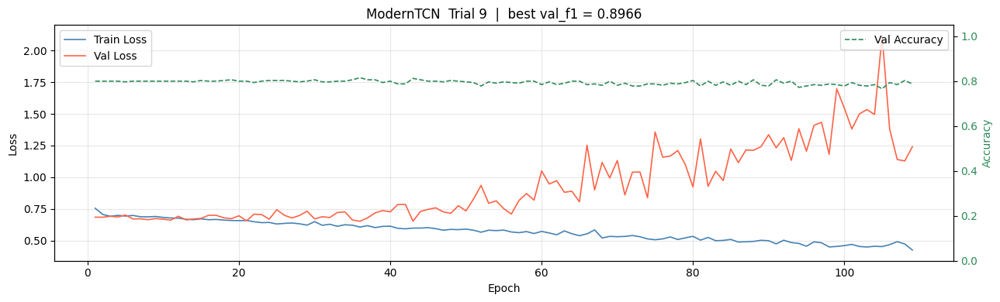

  [ModernTCN] trial 10 (COMPLETE ) val_f1=0.8919  best=0.9029  (done=11, pruned=0)


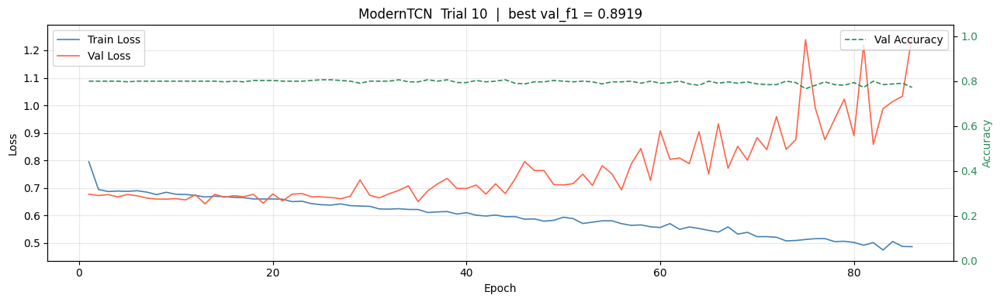

  [ModernTCN] trial 11 (COMPLETE ) val_f1=0.9039  best=0.9039  (done=12, pruned=0)


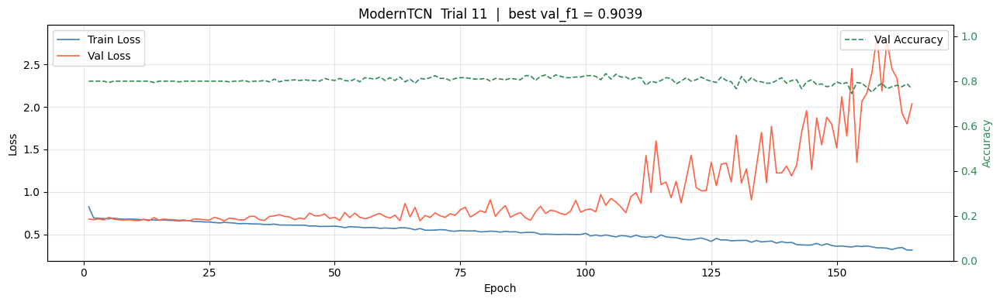

  [ModernTCN] trial 12 (COMPLETE ) val_f1=0.8931  best=0.9039  (done=13, pruned=0)


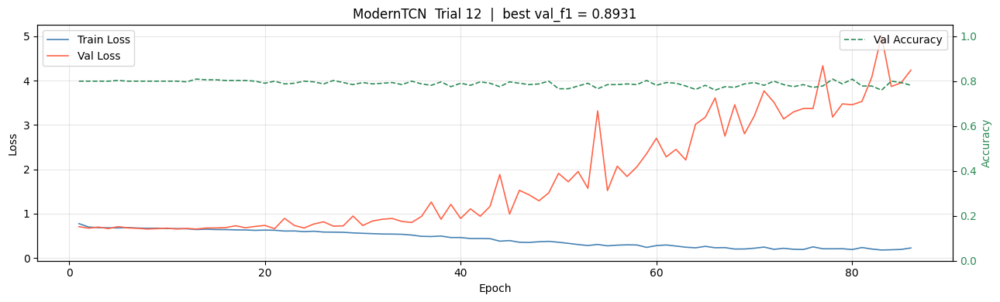

  [ModernTCN] trial 13 (COMPLETE ) val_f1=0.8916  best=0.9039  (done=14, pruned=0)


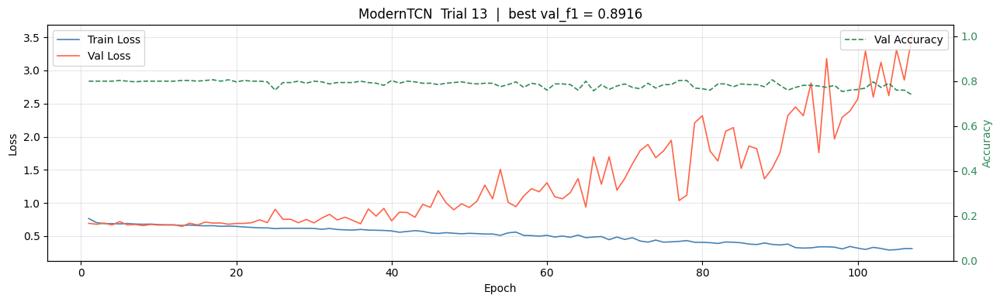

  [ModernTCN] trial 14 (COMPLETE ) val_f1=0.8889  best=0.9039  (done=15, pruned=0)


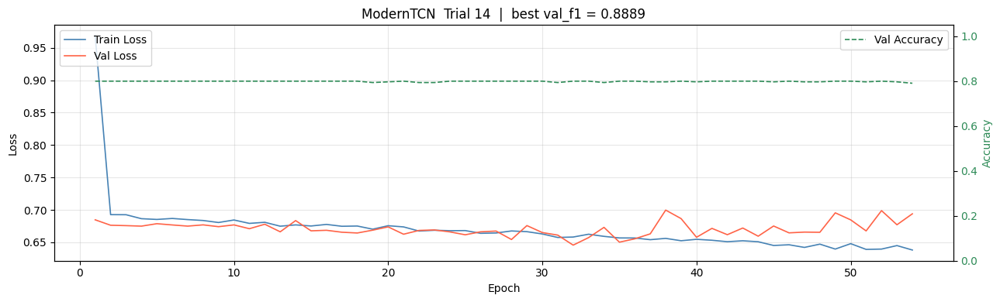

  Best: trial 11  val_f1=0.9039
  Params: {'lr': 0.00030441539761120735, 'wd': 1.5874465951469842e-05, 'dropout': 0.07270139705872788, 'bs': 32, 'patience': 61, 'd_model': 128, 'n_blocks': 1}
  E4 Overall F1: 0.9364

 Model: CrossGNN   study: stage1_ES_CW_CrossGNN
  Resuming from trial 0, running 15 more.
  [CrossGNN] trial  0 (COMPLETE ) val_f1=0.8889  best=0.8889  (done=1, pruned=0)


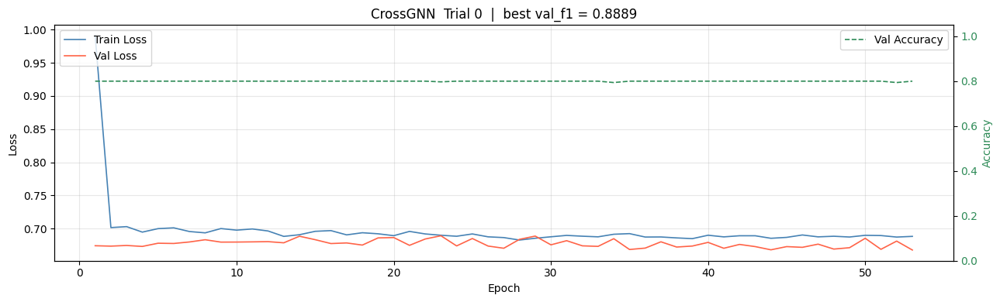

  [CrossGNN] trial  1 (COMPLETE ) val_f1=0.8889  best=0.8889  (done=2, pruned=0)


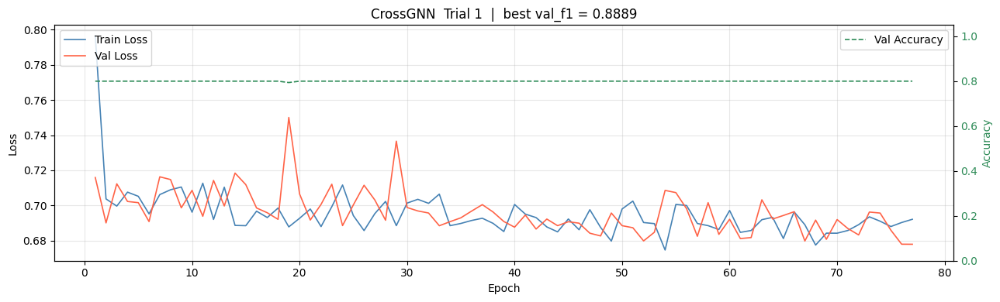

  [CrossGNN] trial  2 (COMPLETE ) val_f1=0.8889  best=0.8889  (done=3, pruned=0)


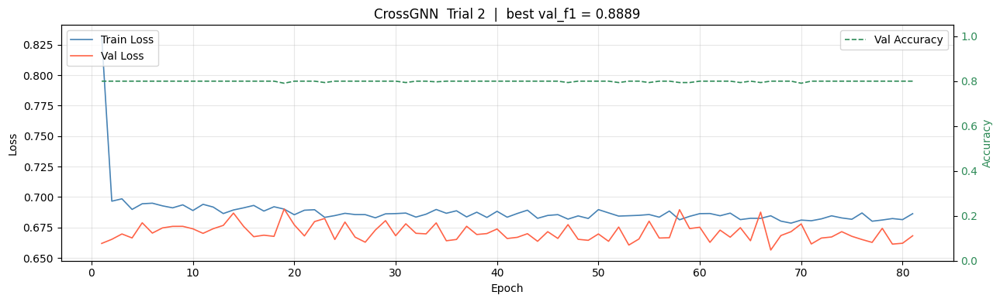

  [CrossGNN] trial  3 (COMPLETE ) val_f1=0.8889  best=0.8889  (done=4, pruned=0)


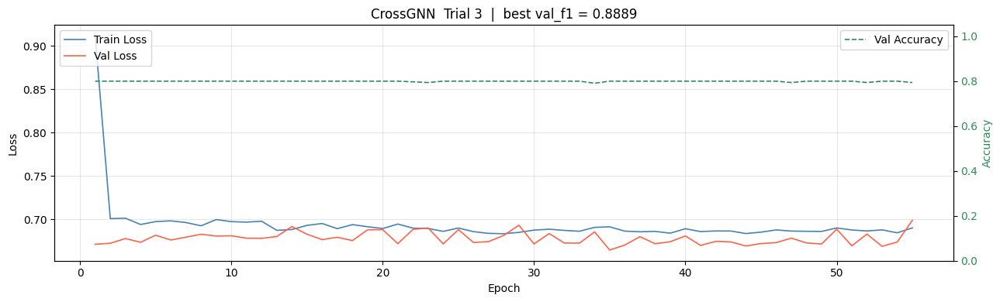

  [CrossGNN] trial  4 (COMPLETE ) val_f1=0.8889  best=0.8889  (done=5, pruned=0)


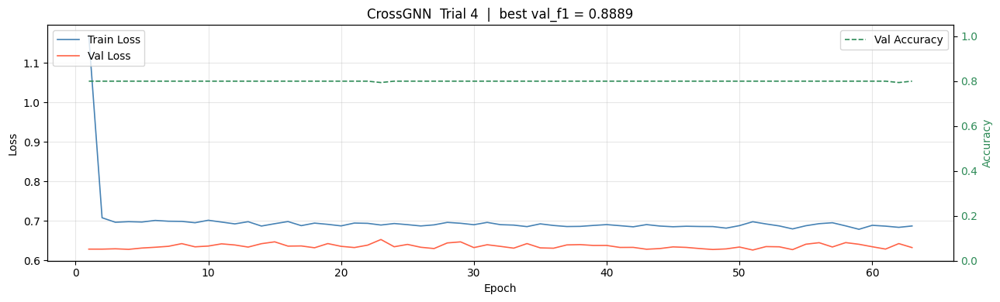

  [CrossGNN] trial  5 (COMPLETE ) val_f1=0.8962  best=0.8962  (done=6, pruned=0)


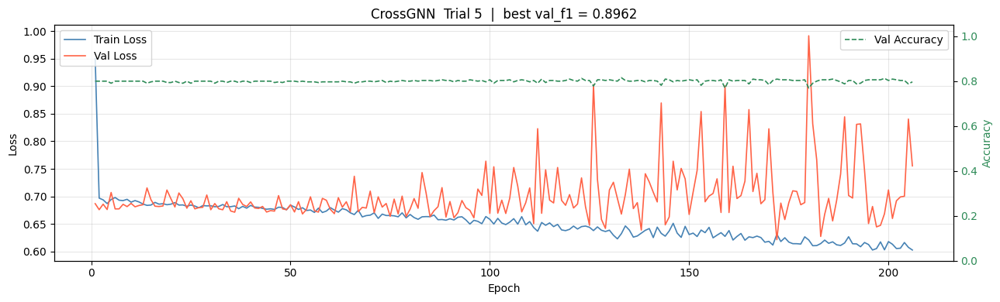

  [CrossGNN] trial  6 (COMPLETE ) val_f1=0.8889  best=0.8962  (done=7, pruned=0)


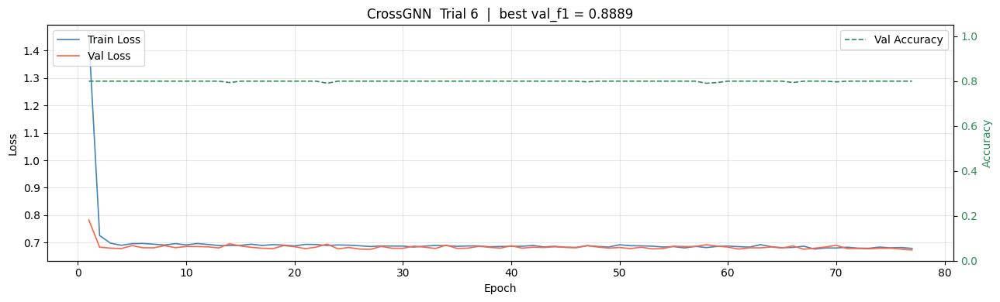

  [CrossGNN] trial  7 (COMPLETE ) val_f1=0.9049  best=0.9049  (done=8, pruned=0)


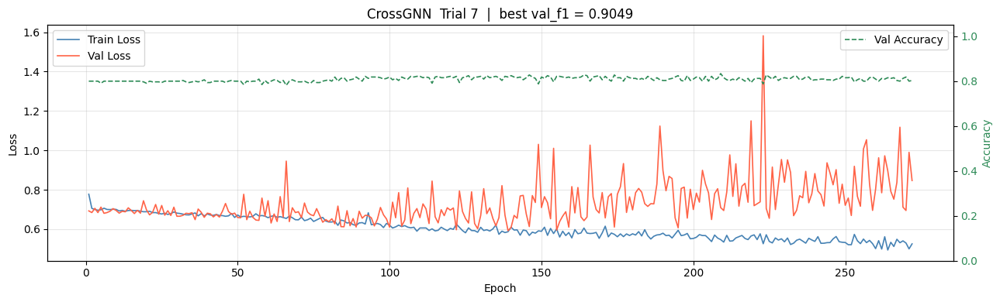

  [CrossGNN] trial  8 (COMPLETE ) val_f1=0.8889  best=0.9049  (done=9, pruned=0)


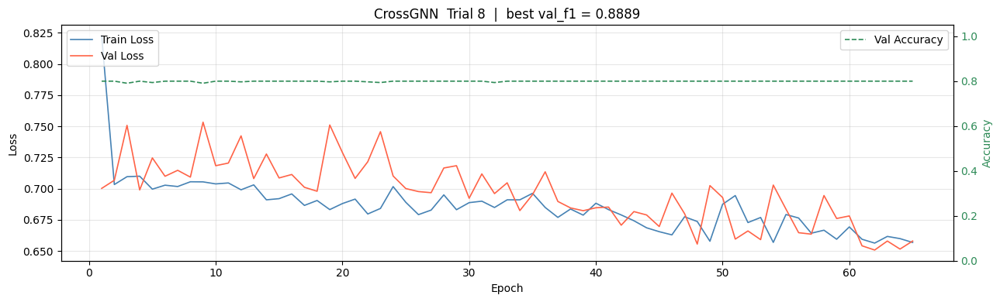

  [CrossGNN] trial  9 (COMPLETE ) val_f1=0.8931  best=0.9049  (done=10, pruned=0)


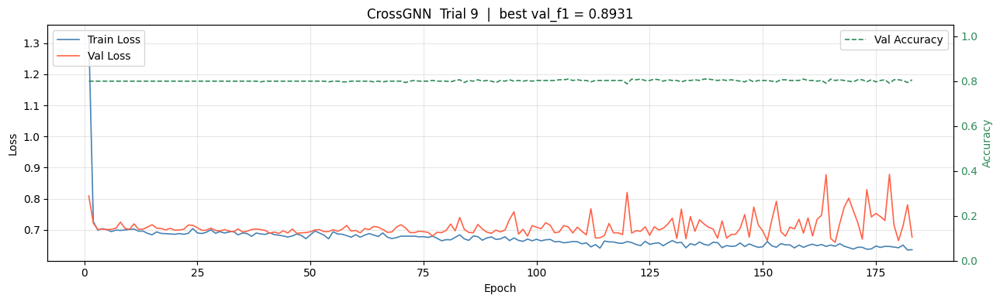

  [CrossGNN] trial 10 (COMPLETE ) val_f1=0.9033  best=0.9049  (done=11, pruned=0)


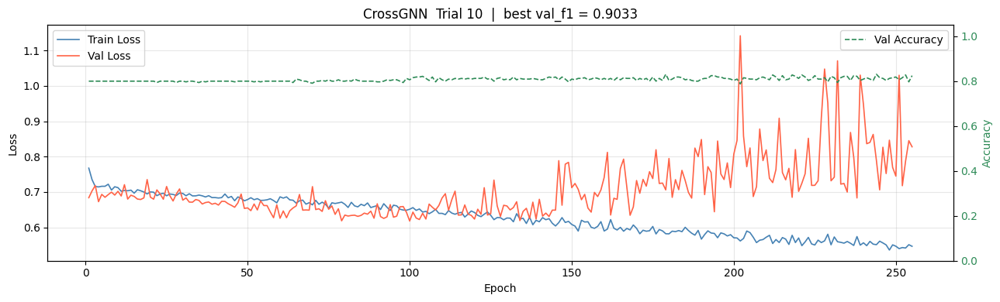

  [CrossGNN] trial 11 (COMPLETE ) val_f1=0.9021  best=0.9049  (done=12, pruned=0)


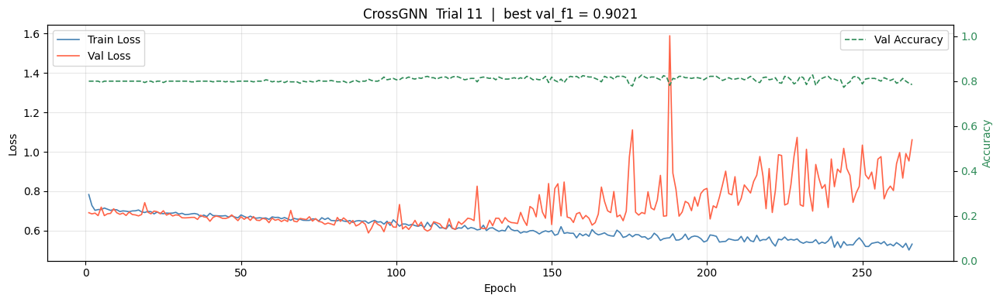

  [CrossGNN] trial 12 (COMPLETE ) val_f1=0.9027  best=0.9049  (done=13, pruned=0)


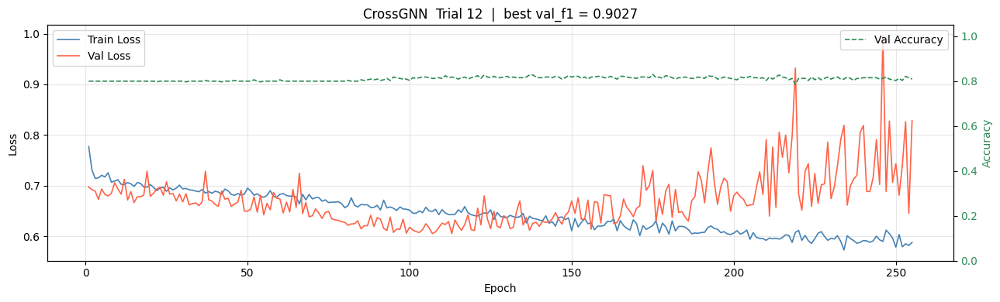

  [CrossGNN] trial 13 (COMPLETE ) val_f1=0.9021  best=0.9049  (done=14, pruned=0)


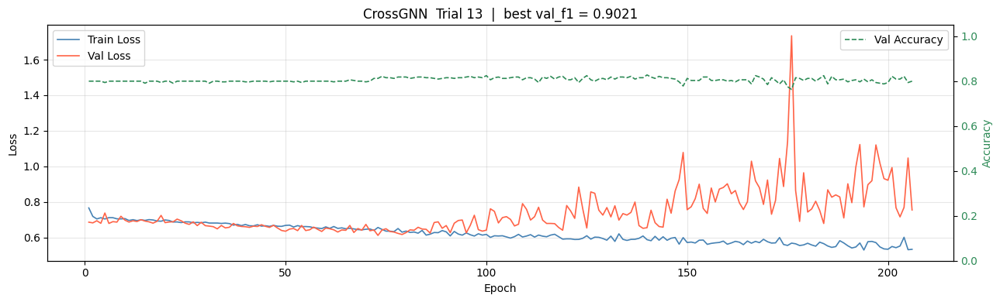

  [CrossGNN] trial 14 (COMPLETE ) val_f1=0.8889  best=0.9049  (done=15, pruned=0)


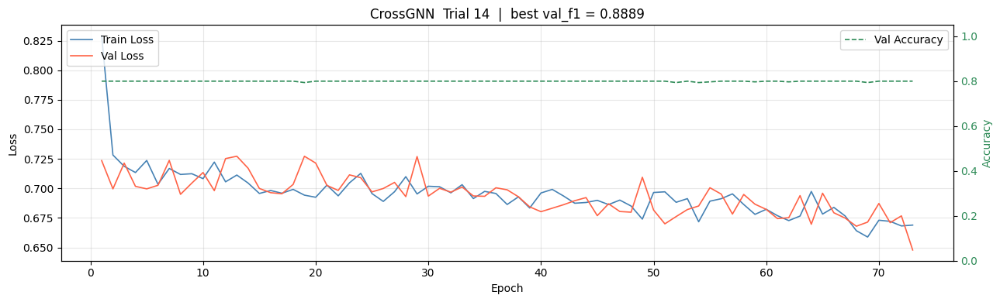

  Best: trial 7  val_f1=0.9049
  Params: {'lr': 0.002145330581281103, 'wd': 0.005329183192660935, 'dropout': 0.18927409277314144, 'bs': 32, 'patience': 63, 'd_model': 32, 'n_layers': 4}
  E4 Overall F1: 0.9428

 Model: TimesNet   study: stage1_ES_CW_TimesNet
  Resuming from trial 0, running 15 more.
  [TimesNet] trial  0 (COMPLETE ) val_f1=0.8889  best=0.8889  (done=1, pruned=0)


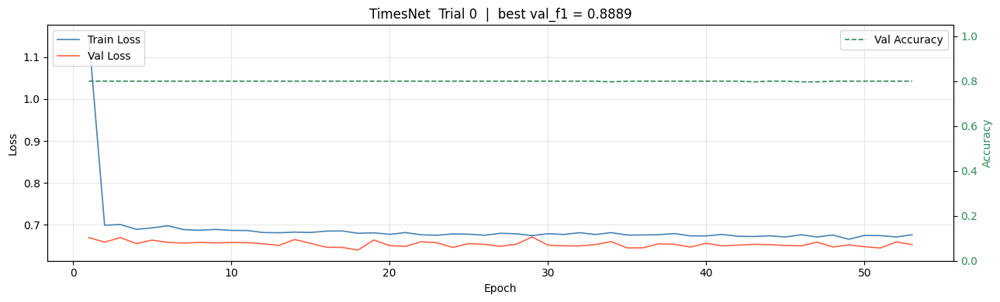

  [TimesNet] trial  1 (COMPLETE ) val_f1=0.8916  best=0.8916  (done=2, pruned=0)


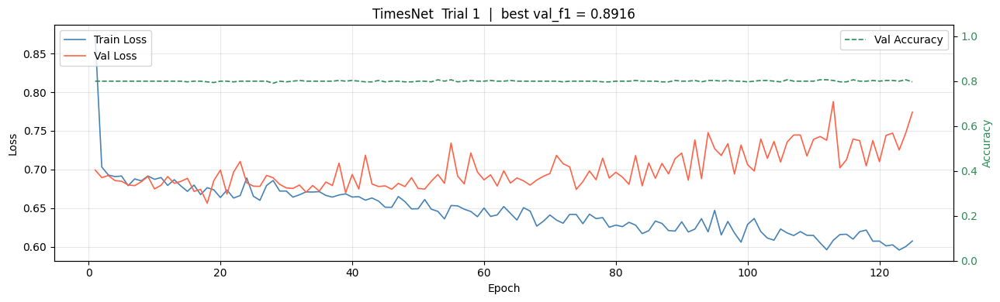

  [TimesNet] trial  2 (COMPLETE ) val_f1=0.8998  best=0.8998  (done=3, pruned=0)


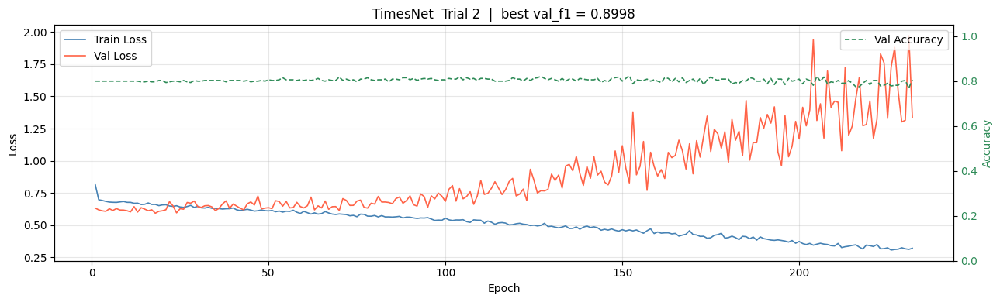

  [TimesNet] trial  3 (COMPLETE ) val_f1=0.9024  best=0.9024  (done=4, pruned=0)


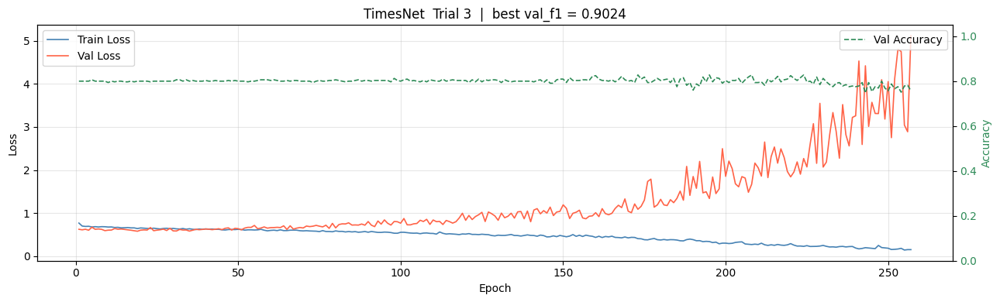

  [TimesNet] trial  4 (COMPLETE ) val_f1=0.8963  best=0.9024  (done=5, pruned=0)


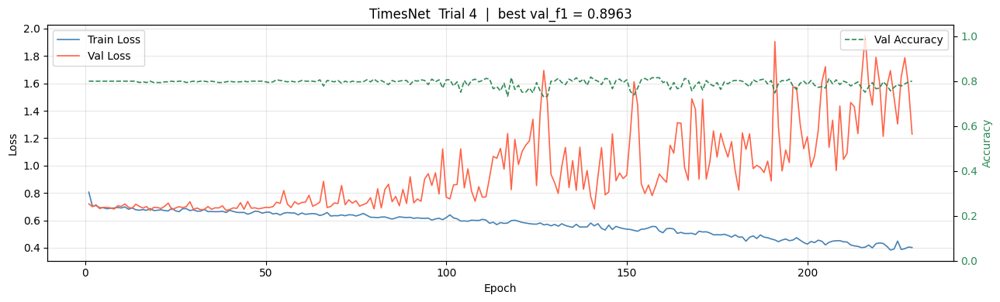

  [TimesNet] trial  5 (COMPLETE ) val_f1=0.8950  best=0.9024  (done=6, pruned=0)


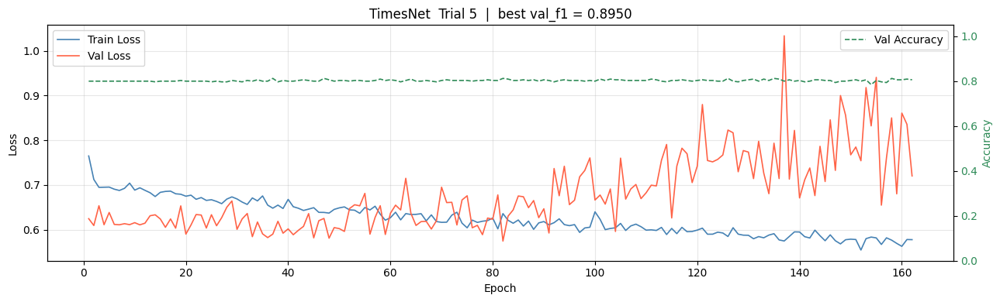

  [TimesNet] trial  6 (COMPLETE ) val_f1=0.8962  best=0.9024  (done=7, pruned=0)


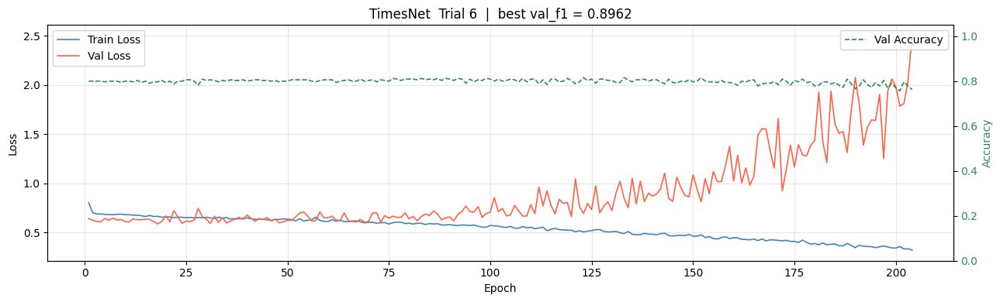

  [TimesNet] trial  7 (COMPLETE ) val_f1=0.9037  best=0.9037  (done=8, pruned=0)


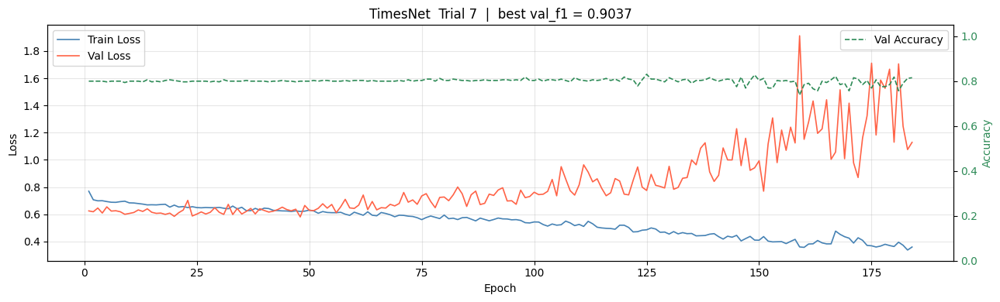

  [TimesNet] trial  8 (COMPLETE ) val_f1=0.8974  best=0.9037  (done=9, pruned=0)


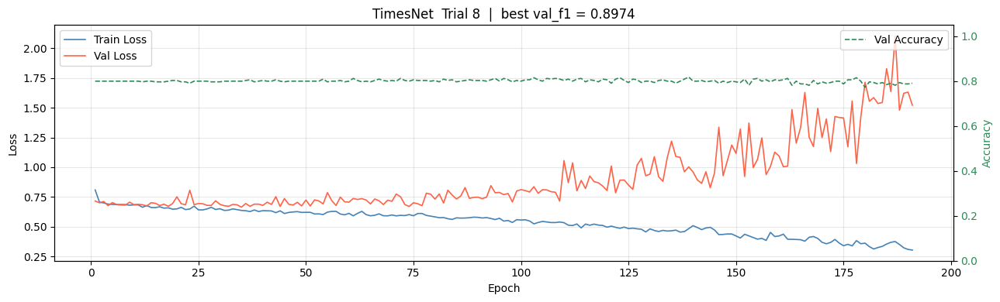

  [TimesNet] trial  9 (COMPLETE ) val_f1=0.9052  best=0.9052  (done=10, pruned=0)


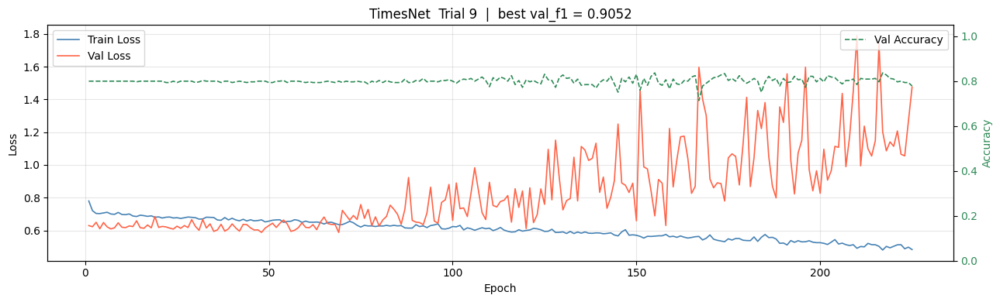

  [TimesNet] trial 10 (COMPLETE ) val_f1=0.8931  best=0.9052  (done=11, pruned=0)


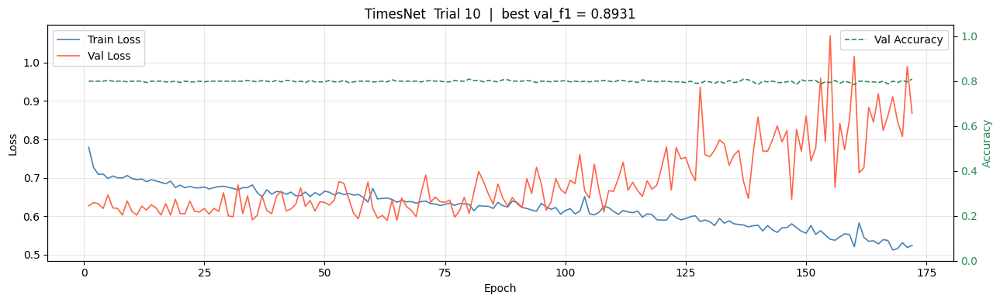

  [TimesNet] trial 11 (COMPLETE ) val_f1=0.8962  best=0.9052  (done=12, pruned=0)


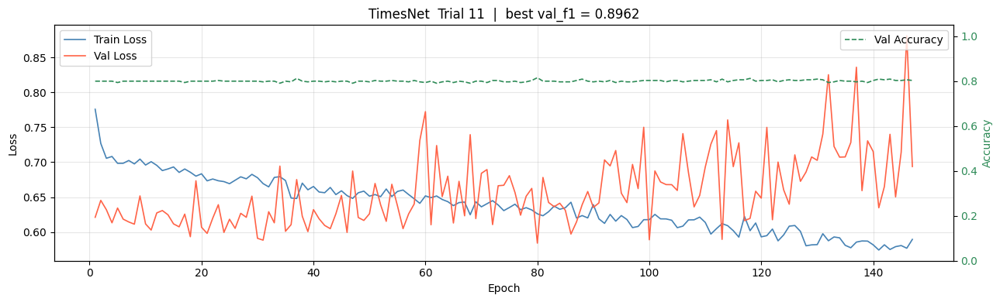

  [TimesNet] trial 12 (COMPLETE ) val_f1=0.9014  best=0.9052  (done=13, pruned=0)


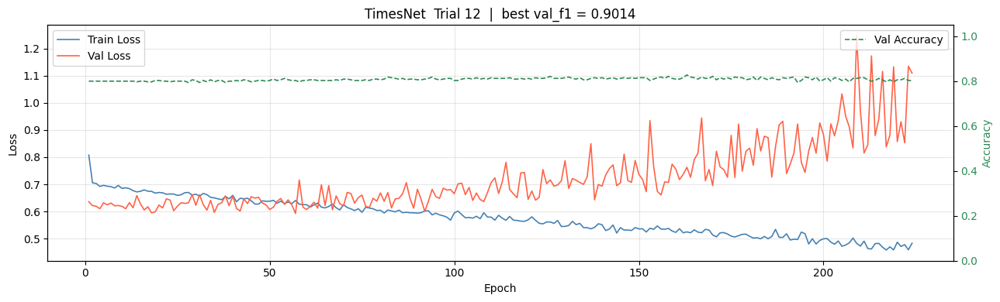

  [TimesNet] trial 13 (COMPLETE ) val_f1=0.8931  best=0.9052  (done=14, pruned=0)


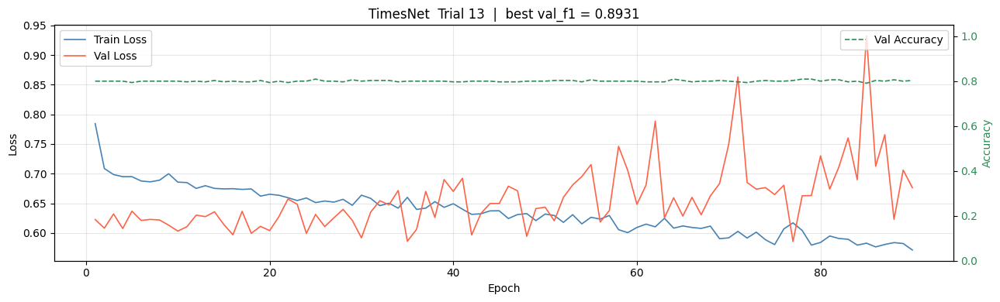

  [TimesNet] trial 14 (COMPLETE ) val_f1=0.8889  best=0.9052  (done=15, pruned=0)


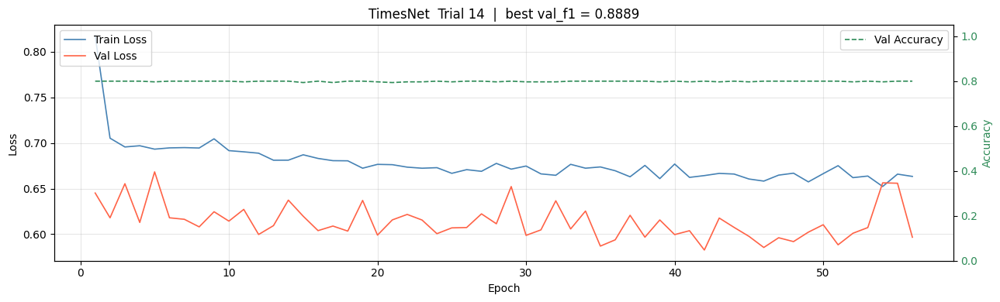

  Best: trial 9  val_f1=0.9052
  Params: {'lr': 0.008410379015147382, 'wd': 0.0002482319649405834, 'dropout': 0.20568916926927555, 'bs': 64, 'patience': 70, 'd_model': 128, 'n_blocks': 3, 'k_periods': 2}
  E4 Overall F1: 0.9275

 Model: Mamba2   study: stage1_ES_CW_Mamba2
  Resuming from trial 0, running 15 more.
  [Mamba2] trial  0 (COMPLETE ) val_f1=0.9005  best=0.9005  (done=1, pruned=0)


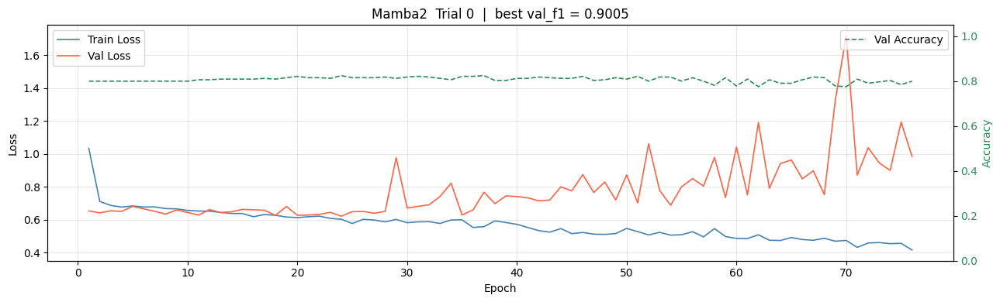

  [Mamba2] trial  1 (COMPLETE ) val_f1=0.9049  best=0.9049  (done=2, pruned=0)


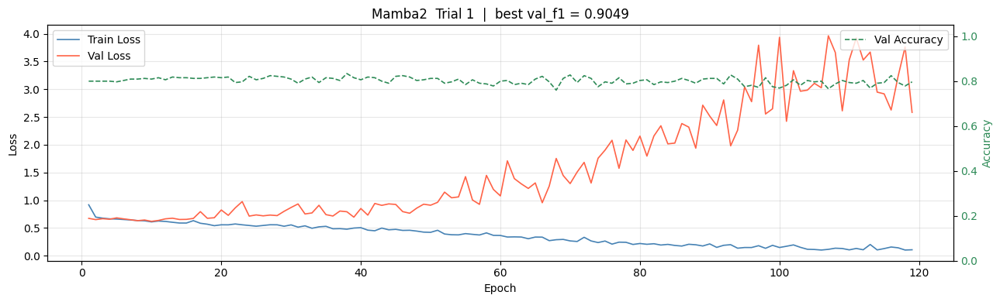

  [Mamba2] trial  2 (COMPLETE ) val_f1=0.8991  best=0.9049  (done=3, pruned=0)


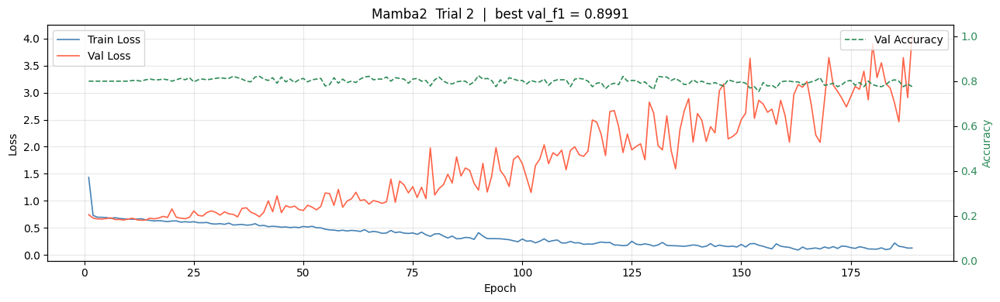

  [Mamba2] trial  3 (COMPLETE ) val_f1=0.9024  best=0.9049  (done=4, pruned=0)


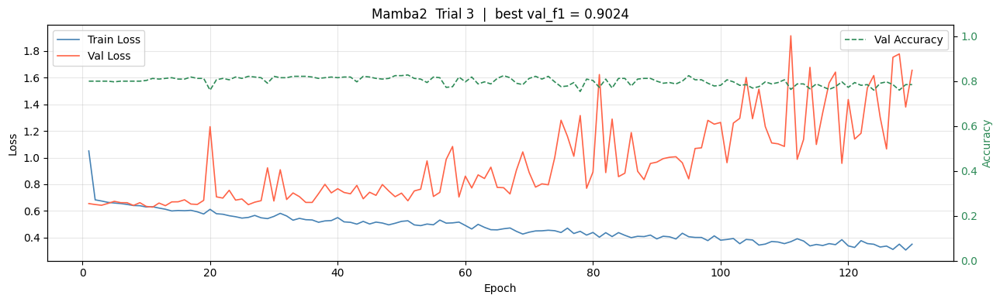

  [Mamba2] trial  4 (COMPLETE ) val_f1=0.9043  best=0.9049  (done=5, pruned=0)


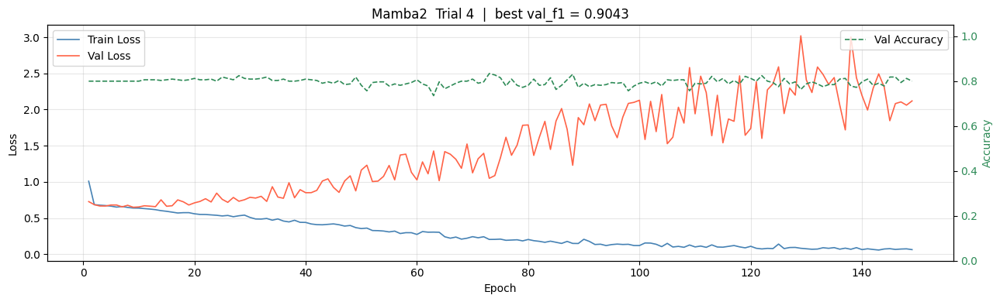

  [Mamba2] trial  5 (COMPLETE ) val_f1=0.8991  best=0.9049  (done=6, pruned=0)


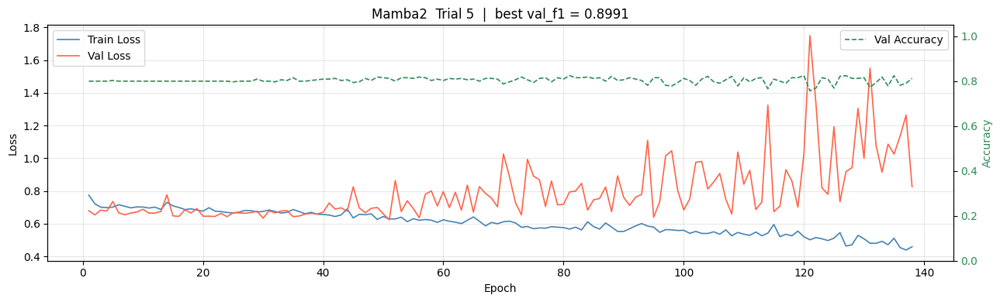

  [Mamba2] trial  6 (COMPLETE ) val_f1=0.9046  best=0.9049  (done=7, pruned=0)


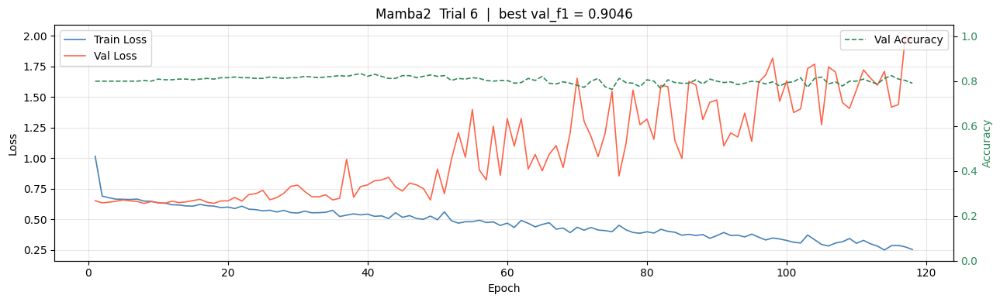

  [Mamba2] trial  7 (COMPLETE ) val_f1=0.9002  best=0.9049  (done=8, pruned=0)


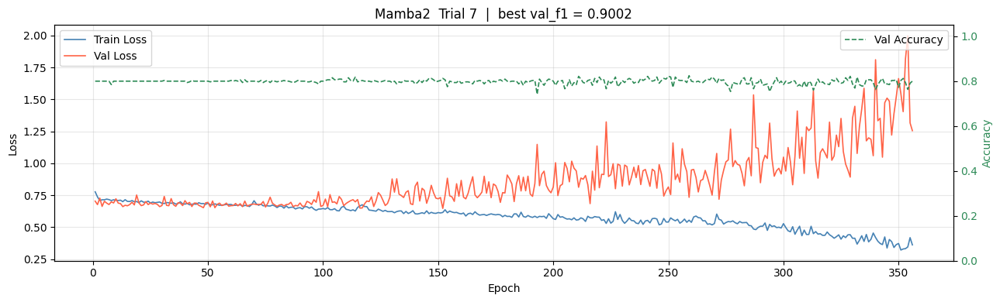

  [Mamba2] trial  8 (COMPLETE ) val_f1=0.9005  best=0.9049  (done=9, pruned=0)


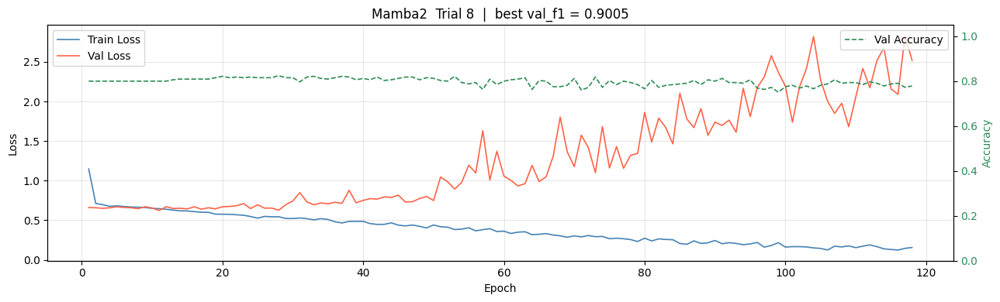

  [Mamba2] trial  9 (COMPLETE ) val_f1=0.9072  best=0.9072  (done=10, pruned=0)


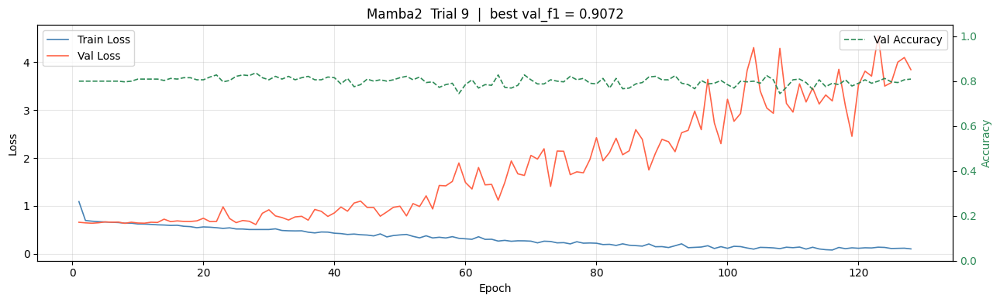

  [Mamba2] trial 10 (COMPLETE ) val_f1=0.9014  best=0.9072  (done=11, pruned=0)


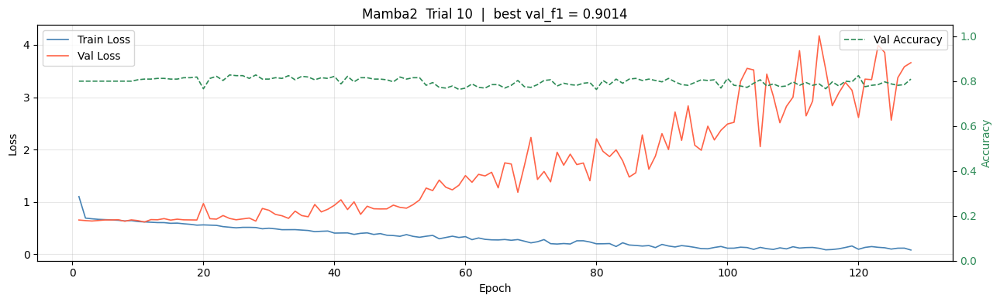

  [Mamba2] trial 11 (COMPLETE ) val_f1=0.8979  best=0.9072  (done=12, pruned=0)


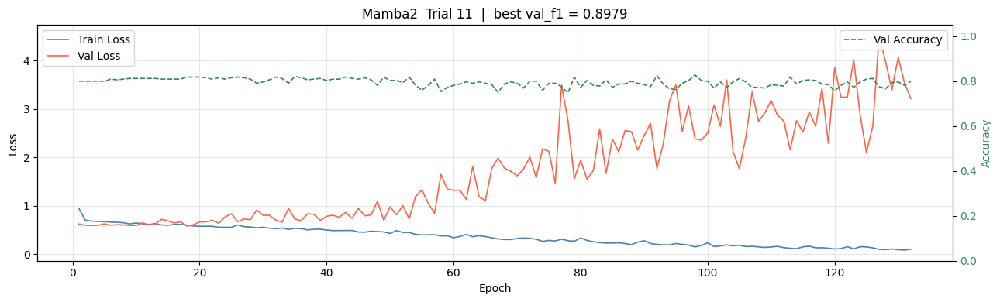

  [Mamba2] trial 12 (COMPLETE ) val_f1=0.9028  best=0.9072  (done=13, pruned=0)


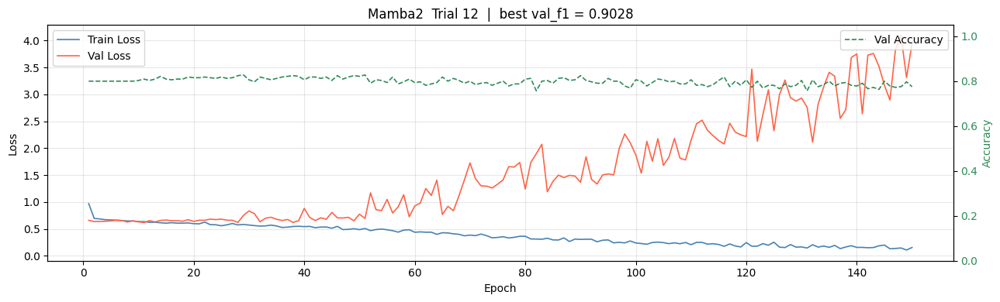

  [Mamba2] trial 13 (COMPLETE ) val_f1=0.9021  best=0.9072  (done=14, pruned=0)


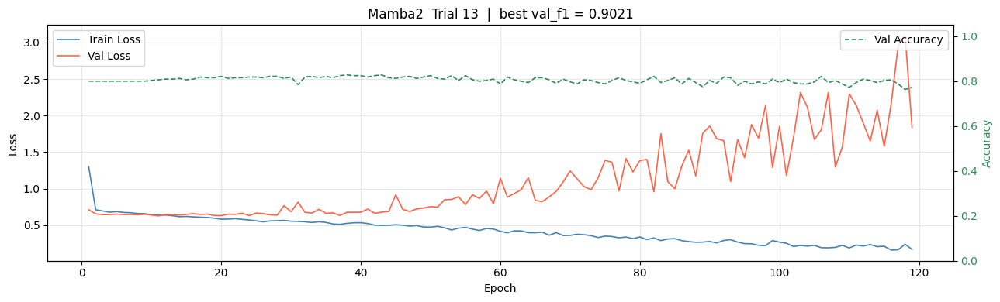

  [Mamba2] trial 14 (COMPLETE ) val_f1=0.9018  best=0.9072  (done=15, pruned=0)


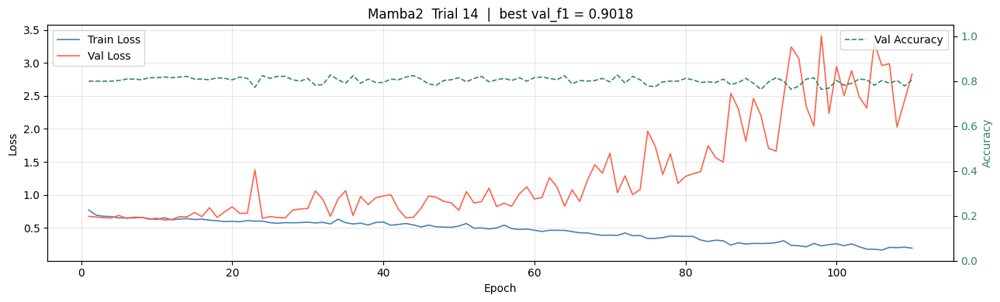

  Best: trial 9  val_f1=0.9072
  Params: {'lr': 0.00011280832583032712, 'wd': 5.137260975528717e-05, 'dropout': 0.05808452623984363, 'bs': 32, 'patience': 100, 'd_model': 128, 'd_state': 8, 'n_layers': 5}
  E4 Overall F1: 0.9544

 Model: iTransformer   study: stage1_ES_CW_iTransformer
  Resuming from trial 0, running 15 more.
  [iTransformer] trial  0 (COMPLETE ) val_f1=0.8993  best=0.8993  (done=1, pruned=0)


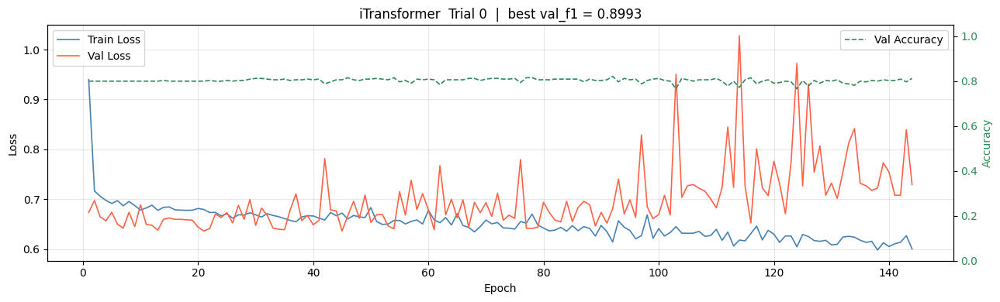

  [iTransformer] trial  1 (COMPLETE ) val_f1=0.8889  best=0.8993  (done=2, pruned=0)


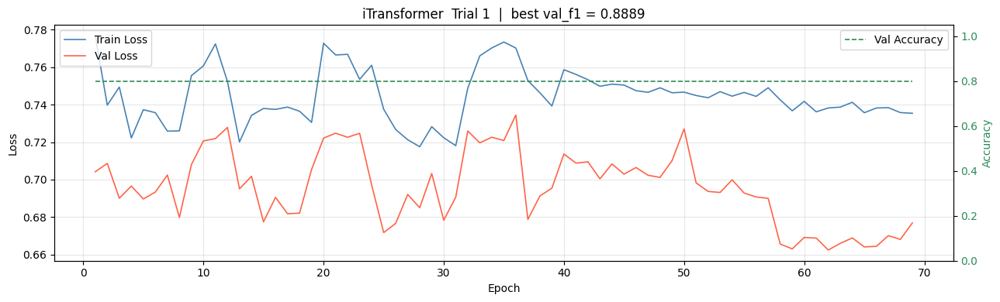

  [iTransformer] trial  2 (COMPLETE ) val_f1=0.8889  best=0.8993  (done=3, pruned=0)


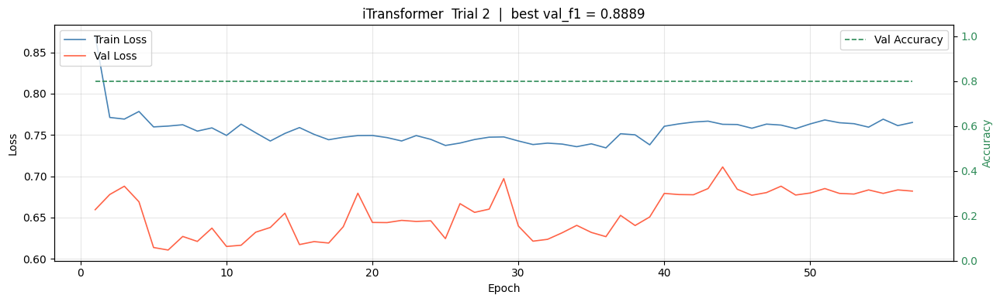

  [iTransformer] trial  3 (COMPLETE ) val_f1=0.8986  best=0.8993  (done=4, pruned=0)


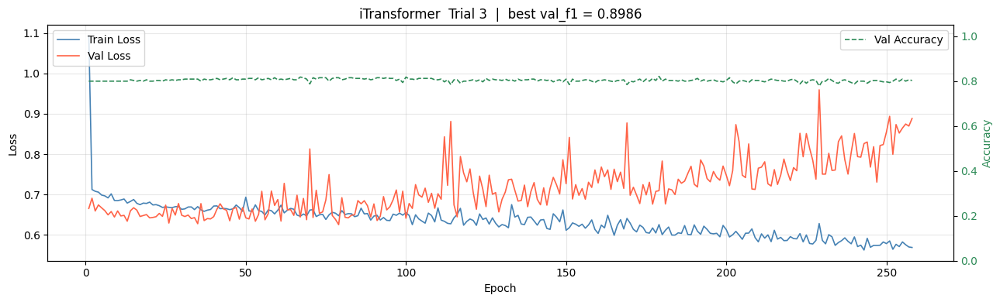

  [iTransformer] trial  4 (COMPLETE ) val_f1=0.8962  best=0.8993  (done=5, pruned=0)


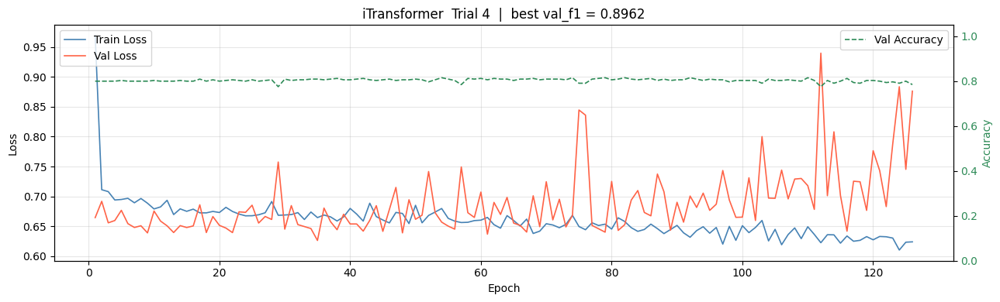

  [iTransformer] trial  5 (COMPLETE ) val_f1=0.8974  best=0.8993  (done=6, pruned=0)


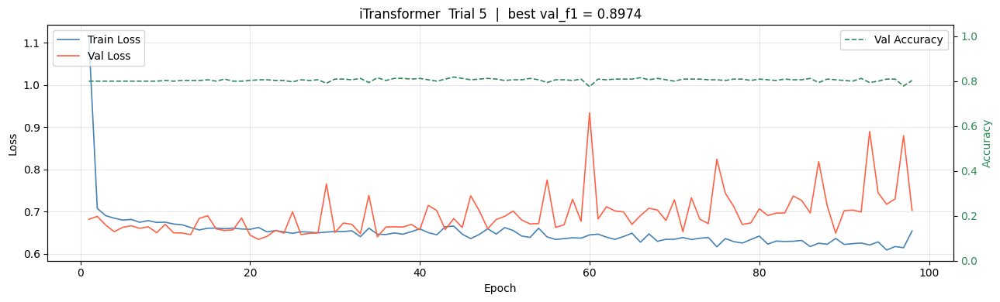

  [iTransformer] trial  6 (COMPLETE ) val_f1=0.8977  best=0.8993  (done=7, pruned=0)


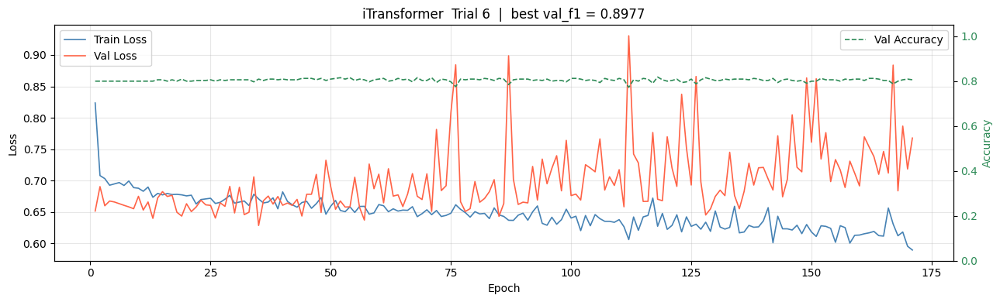

  [iTransformer] trial  7 (COMPLETE ) val_f1=0.8889  best=0.8993  (done=8, pruned=0)


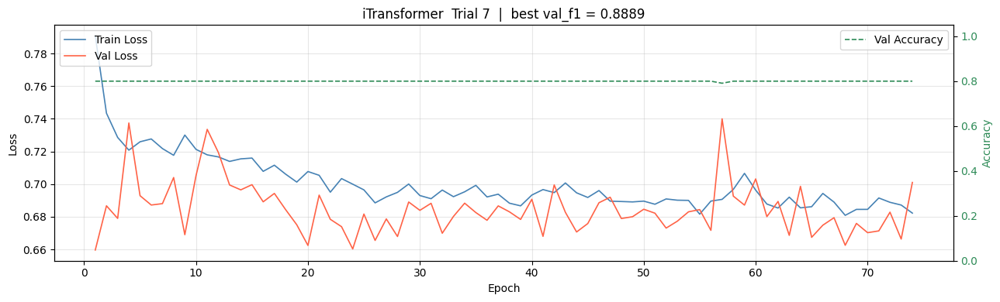

  [iTransformer] trial  8 (COMPLETE ) val_f1=0.8981  best=0.8993  (done=9, pruned=0)


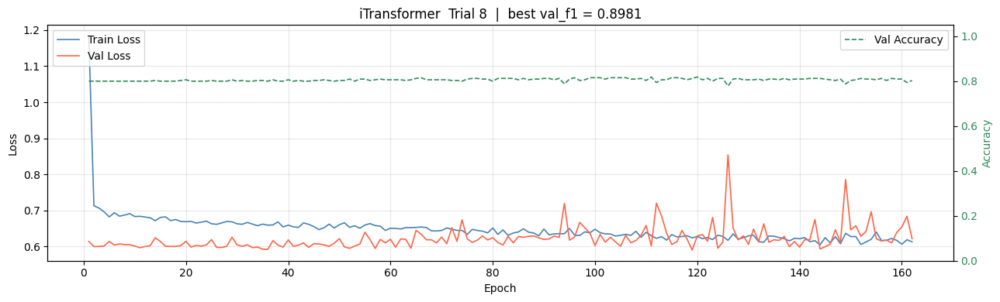

  [iTransformer] trial  9 (COMPLETE ) val_f1=0.8904  best=0.8993  (done=10, pruned=0)


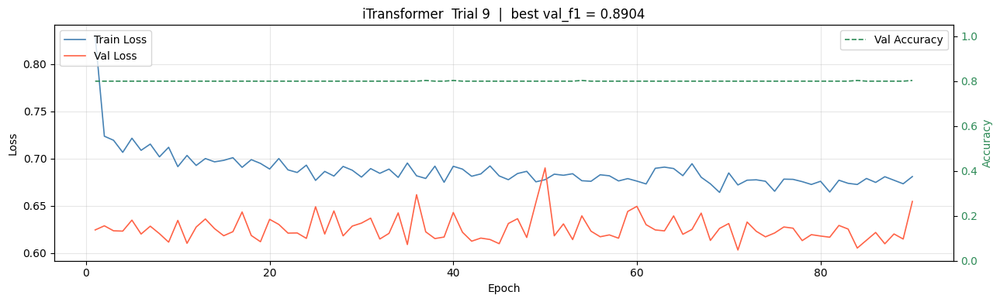

  [iTransformer] trial 10 (COMPLETE ) val_f1=0.8889  best=0.8993  (done=11, pruned=0)


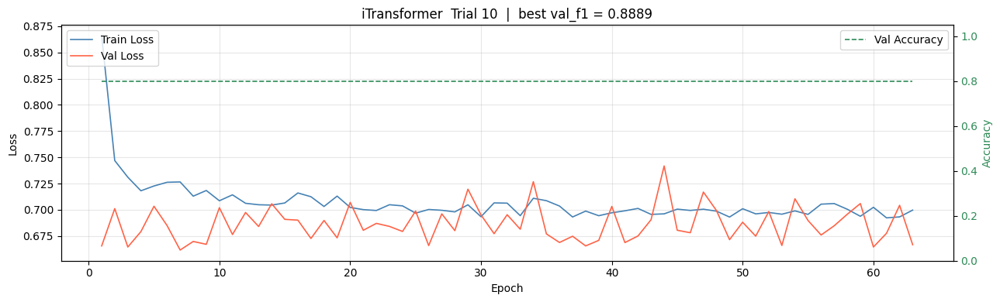

  [iTransformer] trial 11 (COMPLETE ) val_f1=0.8966  best=0.8993  (done=12, pruned=0)


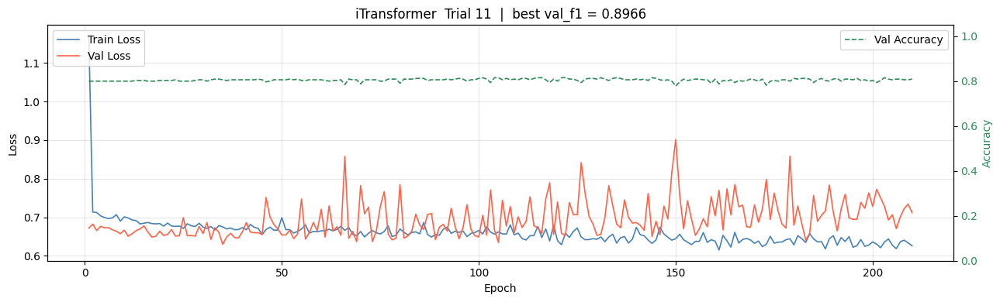

  [iTransformer] trial 12 (COMPLETE ) val_f1=0.8946  best=0.8993  (done=13, pruned=0)


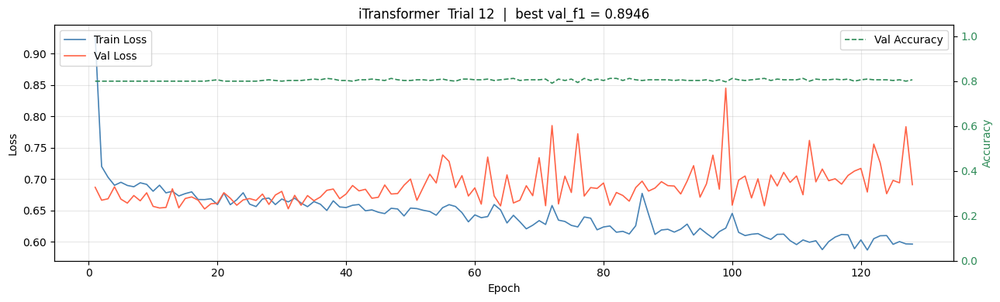

  [iTransformer] trial 13 (COMPLETE ) val_f1=0.8962  best=0.8993  (done=14, pruned=0)


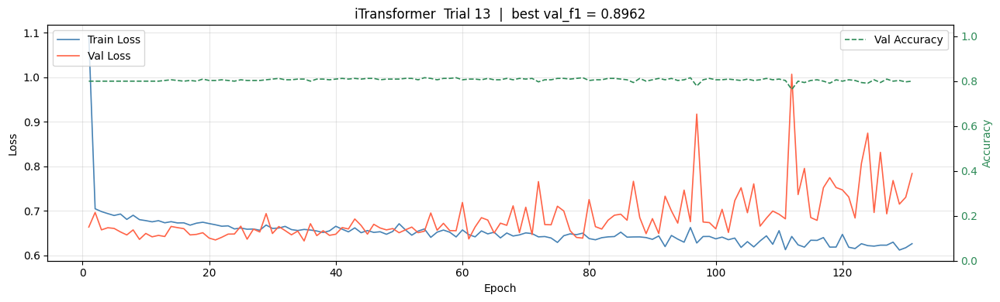

  [iTransformer] trial 14 (COMPLETE ) val_f1=0.8912  best=0.8993  (done=15, pruned=0)


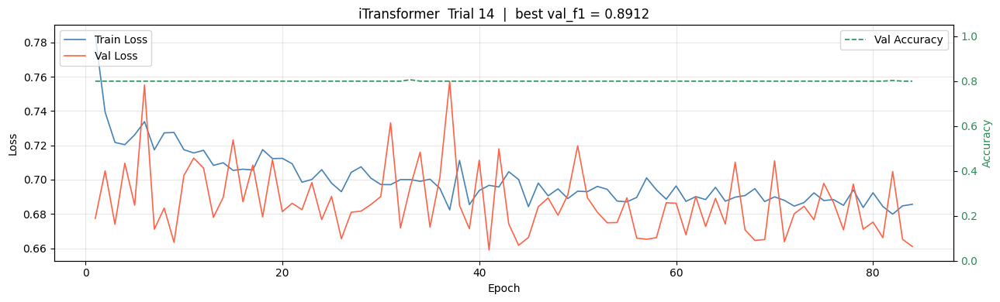

  Best: trial 0  val_f1=0.8993
  Params: {'lr': 0.0005611516415334506, 'wd': 0.0071144760093434225, 'dropout': 0.292797576724562, 'bs': 32, 'patience': 52, 'd_model': 64, 'n_heads': 4, 'n_layers': 1, 'd_ff': 512}
  E4 Overall F1: 0.9374

 Model: PatchTST   study: stage1_ES_CW_PatchTST
  Resuming from trial 0, running 15 more.
  [PatchTST] trial  0 (COMPLETE ) val_f1=0.9065  best=0.9065  (done=1, pruned=0)


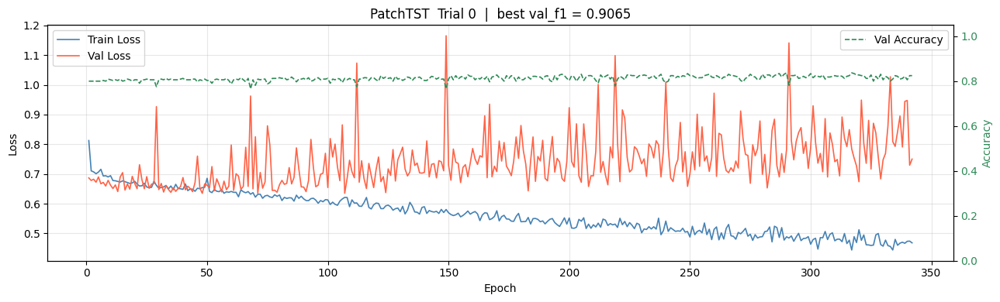

  [PatchTST] trial  1 (COMPLETE ) val_f1=0.8893  best=0.9065  (done=2, pruned=0)


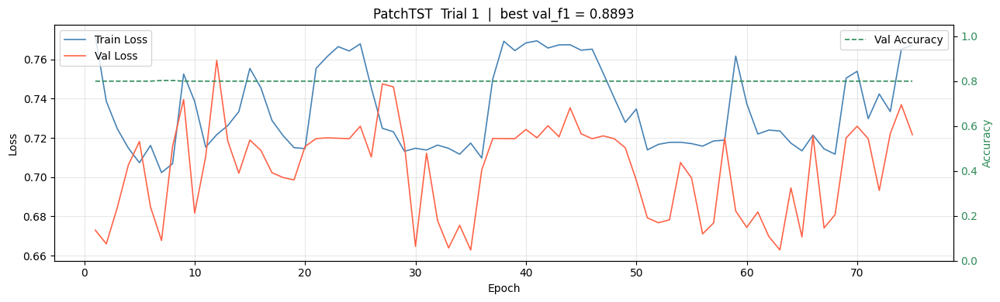

  [PatchTST] trial  2 (COMPLETE ) val_f1=0.8889  best=0.9065  (done=3, pruned=0)


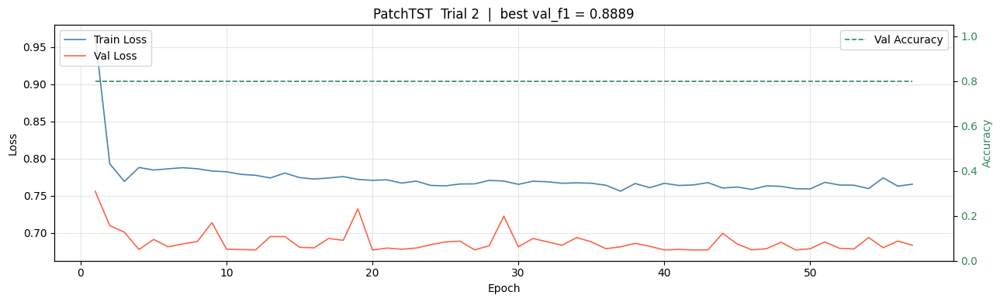

  [PatchTST] trial  3 (COMPLETE ) val_f1=0.9005  best=0.9065  (done=4, pruned=0)


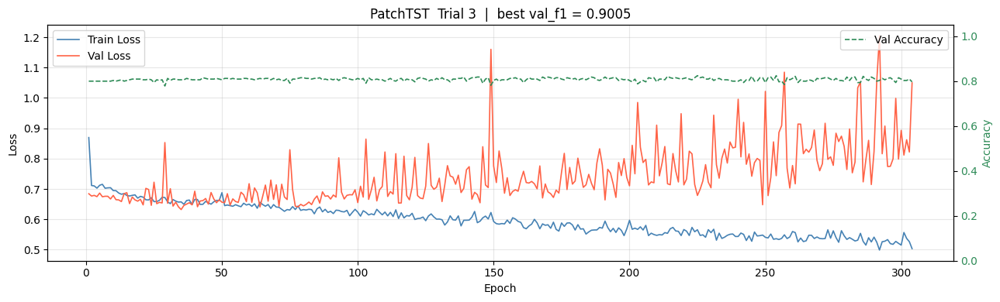

  [PatchTST] trial  4 (COMPLETE ) val_f1=0.8990  best=0.9065  (done=5, pruned=0)


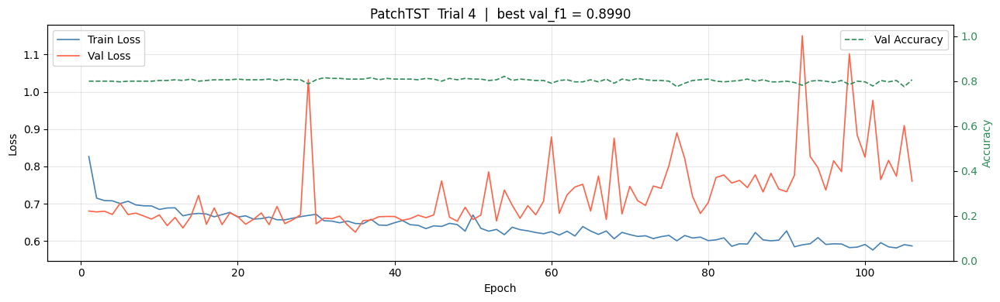

  [PatchTST] trial  5 (COMPLETE ) val_f1=0.9009  best=0.9065  (done=6, pruned=0)


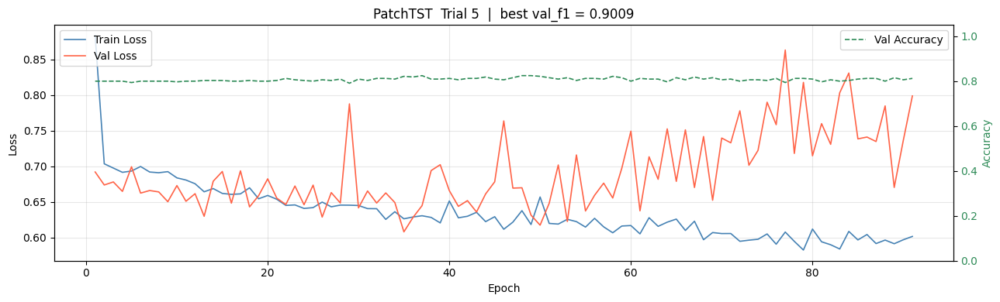

  [PatchTST] trial  6 (COMPLETE ) val_f1=0.8997  best=0.9065  (done=7, pruned=0)


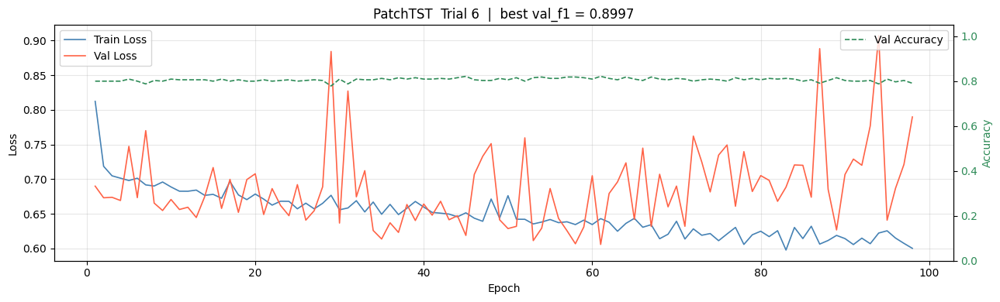

  [PatchTST] trial  7 (COMPLETE ) val_f1=0.8958  best=0.9065  (done=8, pruned=0)


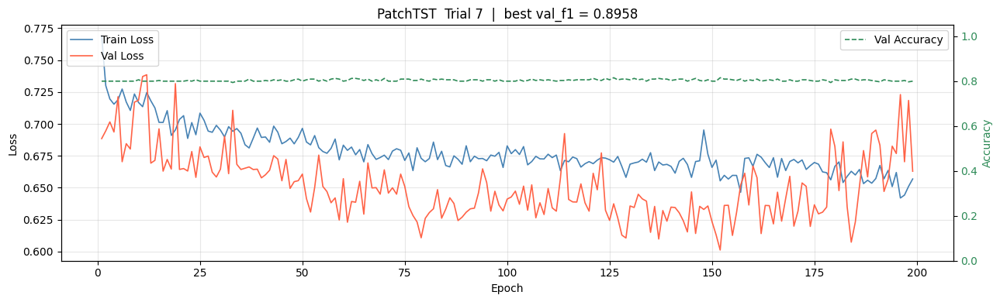

  [PatchTST] trial  8 (COMPLETE ) val_f1=0.8974  best=0.9065  (done=9, pruned=0)


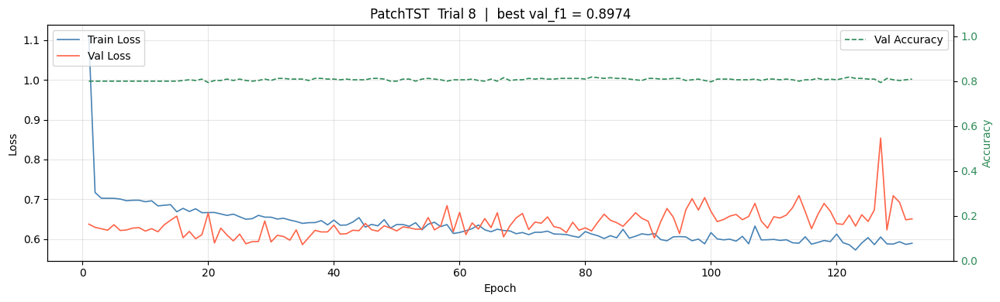

  [PatchTST] trial  9 (COMPLETE ) val_f1=0.9012  best=0.9065  (done=10, pruned=0)


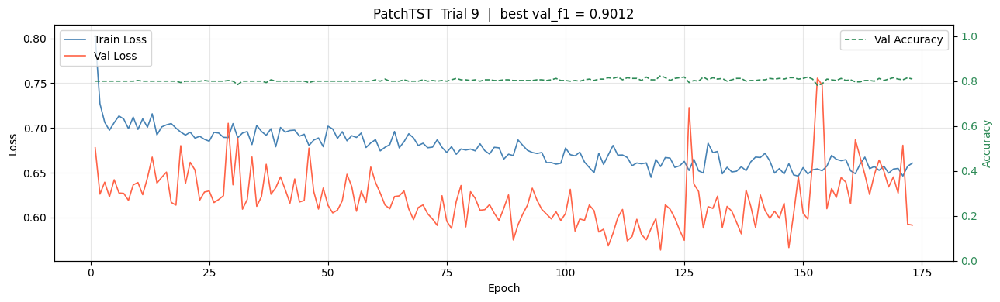

  [PatchTST] trial 10 (COMPLETE ) val_f1=0.8931  best=0.9065  (done=11, pruned=0)


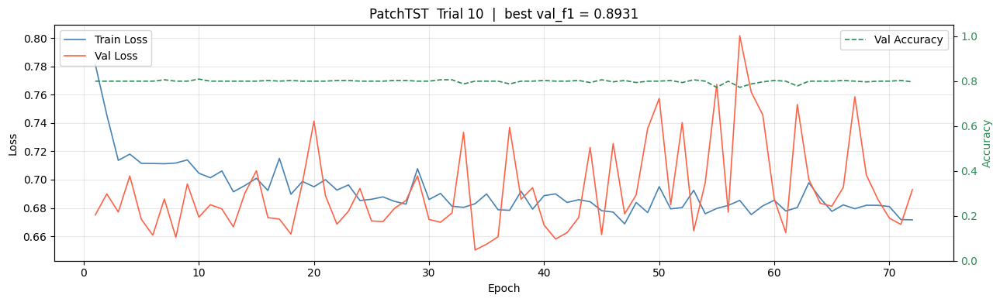

  [PatchTST] trial 11 (COMPLETE ) val_f1=0.8974  best=0.9065  (done=12, pruned=0)


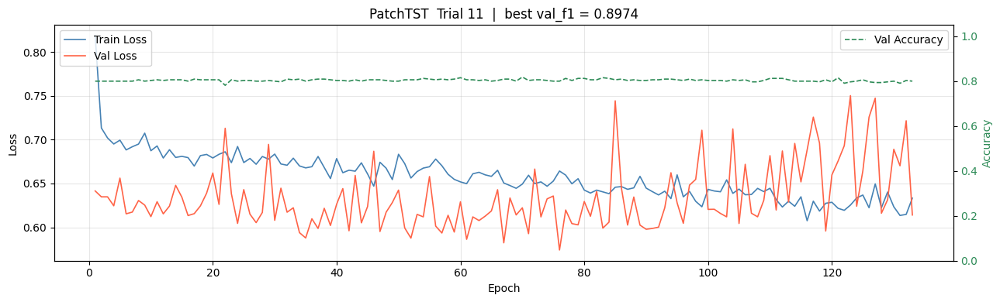

  [PatchTST] trial 12 (COMPLETE ) val_f1=0.9072  best=0.9072  (done=13, pruned=0)


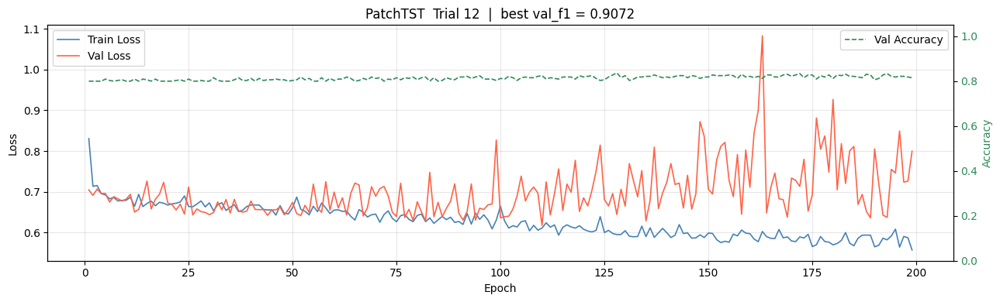

  [PatchTST] trial 13 (COMPLETE ) val_f1=0.8977  best=0.9072  (done=14, pruned=0)


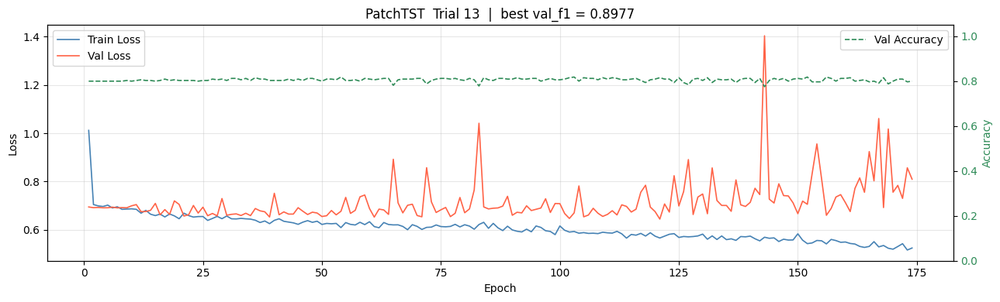

  [PatchTST] trial 14 (COMPLETE ) val_f1=0.8931  best=0.9072  (done=15, pruned=0)


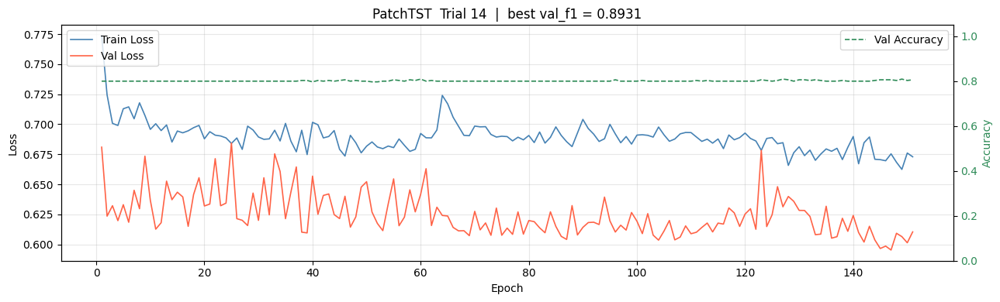

  Best: trial 12  val_f1=0.9072
  Params: {'lr': 0.0010377781088847535, 'wd': 0.003883082422149258, 'dropout': 0.19964271605070896, 'bs': 128, 'patience': 71, 'd_model': 256, 'n_heads': 2, 'n_layers': 1, 'd_ff': 512}
  E4 Overall F1: 0.9427

 Model: TransformerCNN   study: stage1_ES_CW_TransformerCNN
  Resuming from trial 0, running 15 more.
  [TransformerCNN] trial  0 (COMPLETE ) val_f1=0.9094  best=0.9094  (done=1, pruned=0)


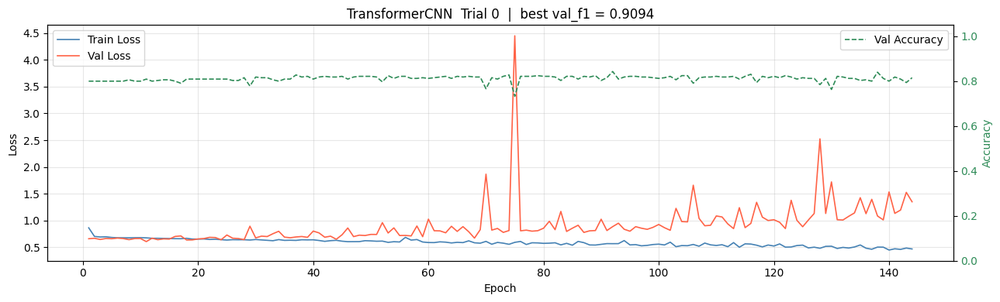

  [TransformerCNN] trial  1 (COMPLETE ) val_f1=0.9024  best=0.9094  (done=2, pruned=0)


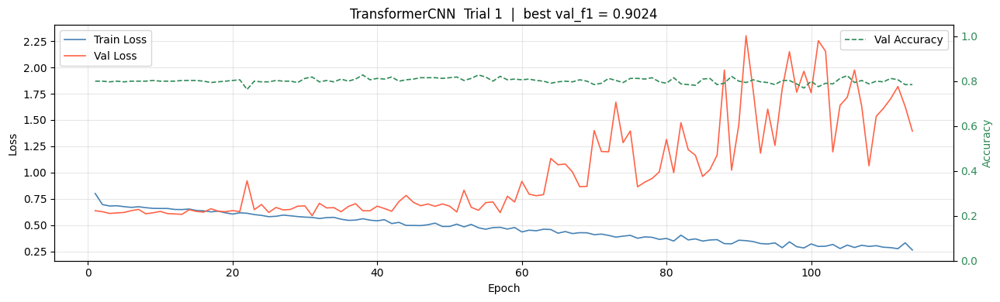

  [TransformerCNN] trial  2 (COMPLETE ) val_f1=0.8995  best=0.9094  (done=3, pruned=0)


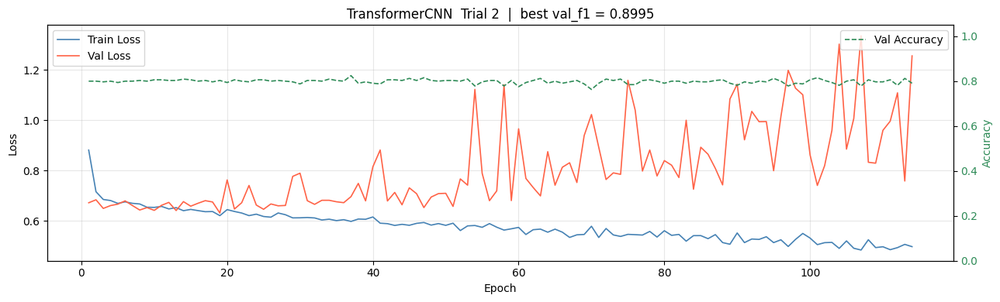

  [TransformerCNN] trial  3 (COMPLETE ) val_f1=0.8889  best=0.9094  (done=4, pruned=0)


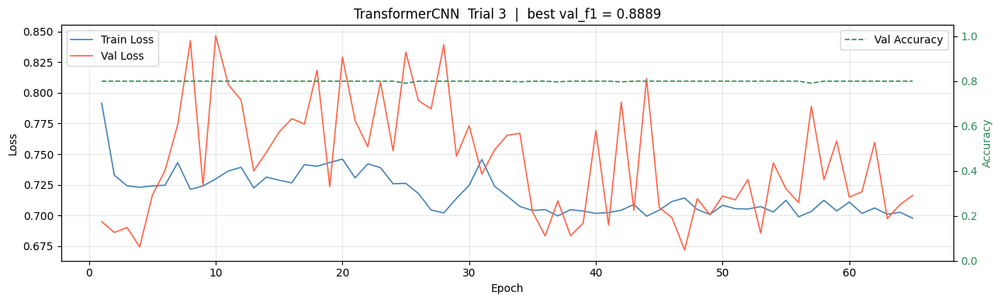

  [TransformerCNN] trial  4 (COMPLETE ) val_f1=0.9021  best=0.9094  (done=5, pruned=0)


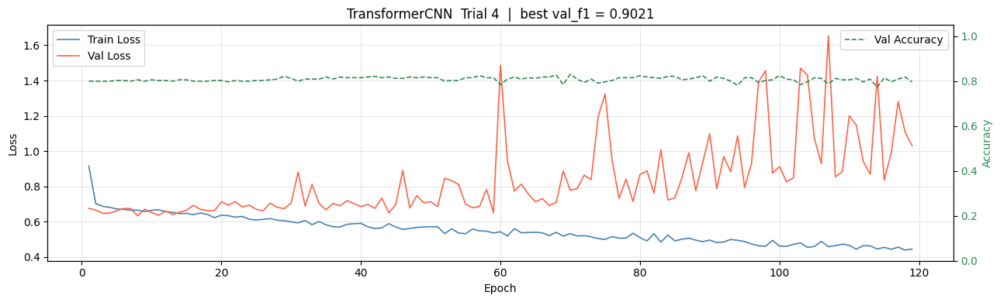

  [TransformerCNN] trial  5 (COMPLETE ) val_f1=0.9011  best=0.9094  (done=6, pruned=0)


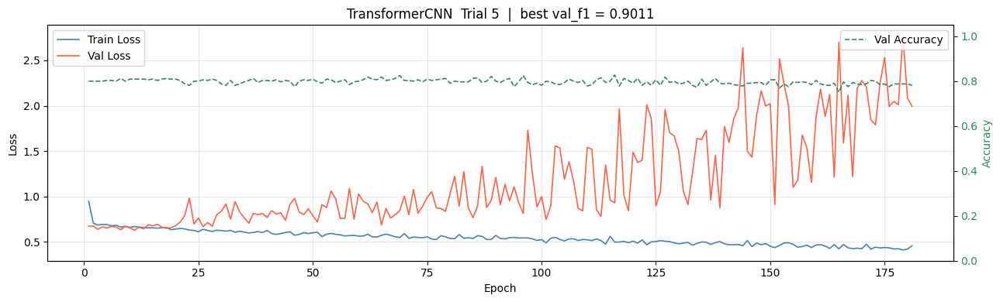

  [TransformerCNN] trial  6 (COMPLETE ) val_f1=0.8966  best=0.9094  (done=7, pruned=0)


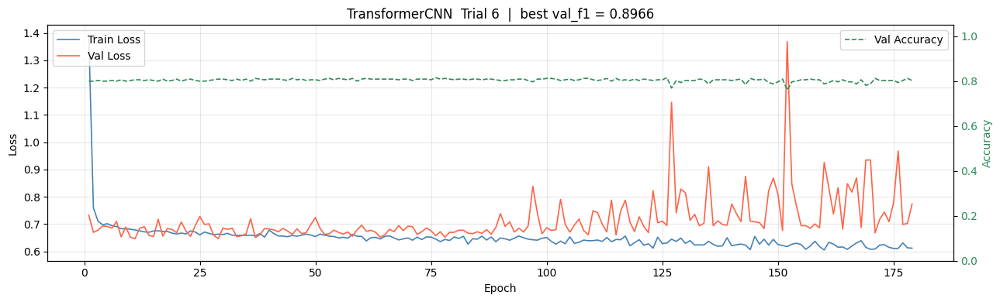

  [TransformerCNN] trial  7 (COMPLETE ) val_f1=0.9028  best=0.9094  (done=8, pruned=0)


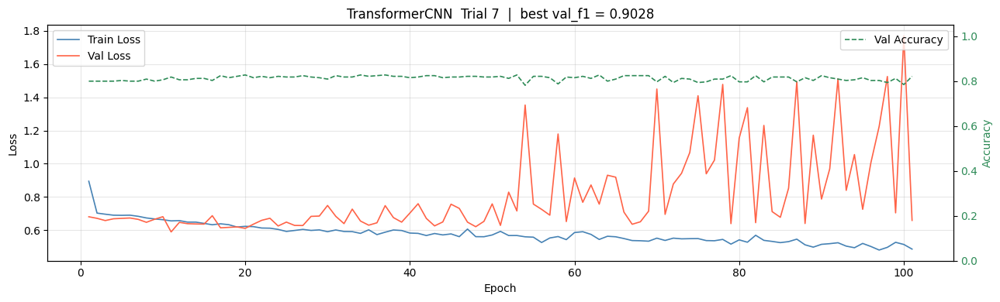

  [TransformerCNN] trial  8 (COMPLETE ) val_f1=0.8931  best=0.9094  (done=9, pruned=0)


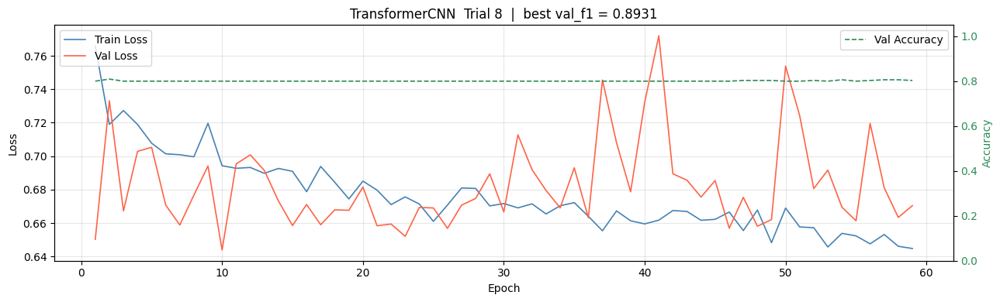

  [TransformerCNN] trial  9 (COMPLETE ) val_f1=0.9024  best=0.9094  (done=10, pruned=0)


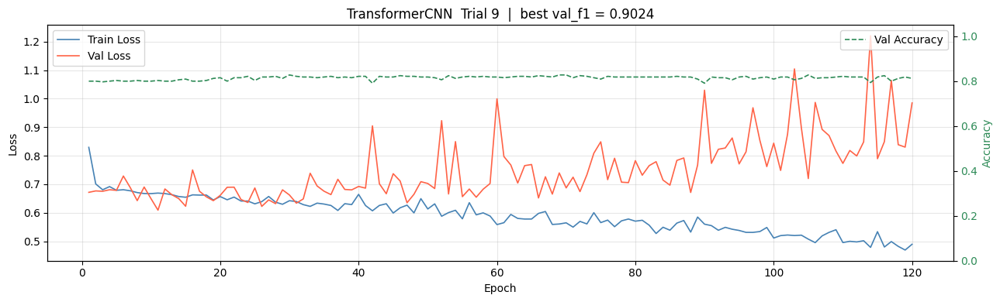

  [TransformerCNN] trial 10 (COMPLETE ) val_f1=0.8974  best=0.9094  (done=11, pruned=0)


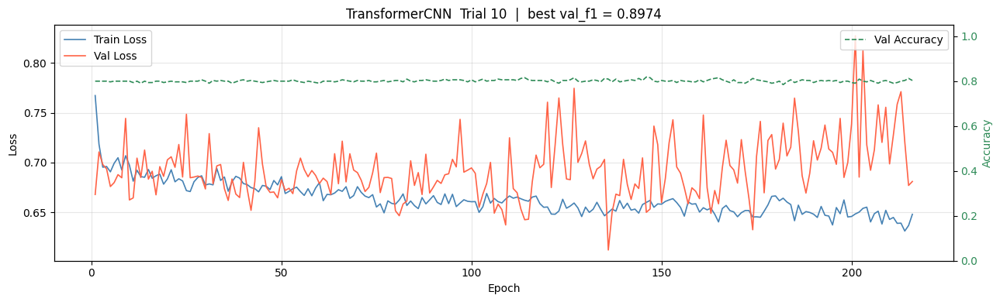

  [TransformerCNN] trial 11 (COMPLETE ) val_f1=0.9056  best=0.9094  (done=12, pruned=0)


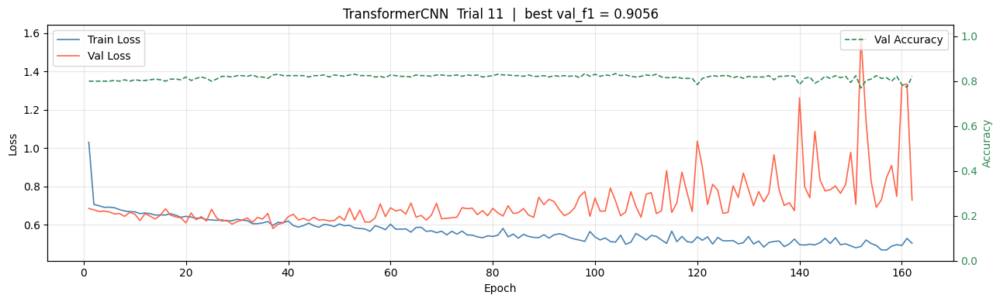

  [TransformerCNN] trial 12 (COMPLETE ) val_f1=0.8993  best=0.9094  (done=13, pruned=0)


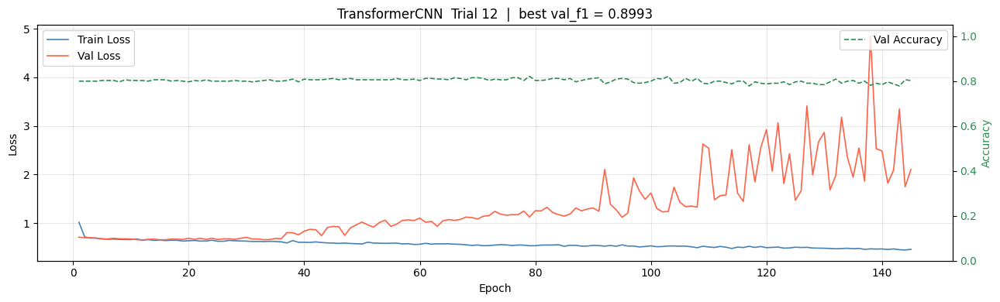

  [TransformerCNN] trial 13 (COMPLETE ) val_f1=0.9028  best=0.9094  (done=14, pruned=0)


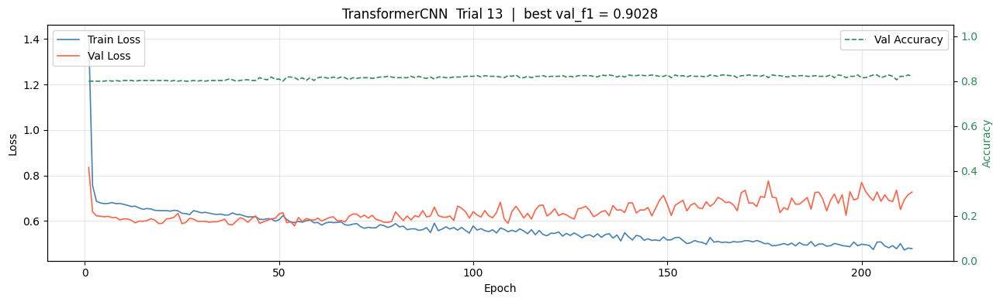

  [TransformerCNN] trial 14 (COMPLETE ) val_f1=0.8990  best=0.9094  (done=15, pruned=0)


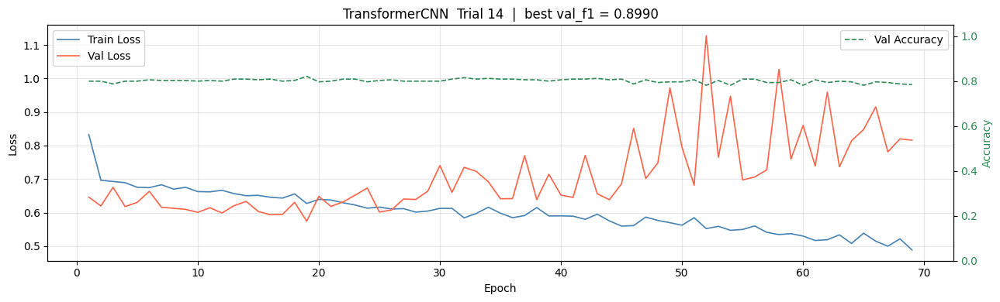

  Best: trial 0  val_f1=0.9094
  Params: {'lr': 0.0005611516415334506, 'wd': 0.0071144760093434225, 'dropout': 0.292797576724562, 'bs': 32, 'patience': 52, 'd_model': 64, 'n_heads': 4, 'n_layers': 1, 'd_ff': 512, 'n_conv_layers': 2, 'cnn_kernel': 7}
  E4 Overall F1: 0.9367

Search complete.


In [9]:
# ── Optuna search loop ────────────────────────────────────────────────────────
import time

e4_results_all: dict[str, dict | None] = {}
study_results:  dict[str, optuna.Study | None] = {}
all_results:    list[dict] = []

for model_name in MODELS:
    study_name = f'stage1_ES_CW_{model_name}'
    print(f'\n{"="*60}')
    print(f' Model: {model_name}   study: {study_name}')
    print(f'{"="*60}')

    sampler = TPESampler(n_startup_trials=3, multivariate=True, seed=42)
    pruner  = NopPruner()   # early stopping disabled

    study = optuna.create_study(
        study_name=study_name,
        storage=STORAGE,
        sampler=sampler,
        pruner=pruner,
        direction='maximize',
        load_if_exists=True,
    )

    n_done = len([t for t in study.trials
                  if t.state in (optuna.trial.TrialState.COMPLETE,
                                 optuna.trial.TrialState.PRUNED)])
    n_remaining = max(0, N_TRIALS - n_done)

    if n_remaining == 0:
        print(f'  Already completed {n_done} trials — skipping.')
    else:
        print(f'  Resuming from trial {n_done}, running {n_remaining} more.')
        t0 = time.perf_counter()

        objective, best_f1_ref, best_hp_ref, trial_histories = make_objective_2000(
            model_name=model_name,
            x_train=x_train, y_train=y_train,
            x_val=x_val,     y_val=y_val,
            W=W, n_channels=N_CHANNELS,
            pos_weight=POS_WEIGHT,
            device=DEVICE,
            save_dir=SAVE_DIR,
            epochs=EPOCHS,
            chronos_pipeline=chronos_pipeline,
        )
        study.optimize(
            objective,
            n_trials=n_remaining,
            callbacks=[make_callbacks(model_name, trial_histories)],
            catch=(Exception,),
        )
        elapsed_min = (time.perf_counter() - t0) / 60.0
        study.set_user_attr('total_time_min', elapsed_min)

    study_results[model_name] = study
    best_ckpt_path = finalize_best_checkpoint(study, model_name, SAVE_DIR)

    completed = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]
    if completed:
        best_trial = max(completed, key=lambda t: t.value)
        model_row = {
            'model':    model_name,
            'val_f1':   best_trial.value,
            'trial_no': best_trial.number,
            **best_trial.params,
        }
        print(f'  Best: trial {best_trial.number}  val_f1={best_trial.value:.4f}')
        print(f'  Params: {best_trial.params}')

        if best_ckpt_path is not None:
            ckpt = torch.load(best_ckpt_path, map_location=DEVICE)
            best_hp = {k: v for k, v in ckpt['hp'].items() if k not in {'bs', 'lr', 'wd'}}
            if model_name == 'Chronos2':
                best_hp['pipeline'] = chronos_pipeline
            best_model = build_model(model_name, W=W, n_channels=N_CHANNELS, **best_hp).to(DEVICE)
            best_model.load_state_dict(ckpt['model_state_dict'])

            e4_result = evaluate_on_e4(best_model, e4_data_per_subject, DEVICE, use_bf16=USE_BF16)
            e4_results_all[model_name] = e4_result
            model_row['e4_accuracy']  = e4_result['overall']['accuracy']  if e4_result['overall'] else float('nan')
            model_row['e4_f1']        = e4_result['overall']['f1']        if e4_result['overall'] else float('nan')
            model_row['e4_precision'] = e4_result['overall']['precision'] if e4_result['overall'] else float('nan')
            model_row['e4_recall']    = e4_result['overall']['recall']    if e4_result['overall'] else float('nan')
            model_row['e4_auroc']     = e4_result['overall'].get('auroc', float('nan')) if e4_result['overall'] else float('nan')
            print(f"  E4 Overall F1: {model_row['e4_f1']:.4f}")
            del best_model
            torch.cuda.empty_cache()
        else:
            e4_results_all[model_name] = None
            for k in ('e4_accuracy', 'e4_f1', 'e4_precision', 'e4_recall', 'e4_auroc'):
                model_row[k] = float('nan')

        all_results.append(model_row)
    else:
        all_results.append({
            'model': model_name, 'val_f1': float('nan'), 'trial_no': -1,
            'e4_accuracy': float('nan'), 'e4_f1': float('nan'),
            'e4_precision': float('nan'), 'e4_recall': float('nan'), 'e4_auroc': float('nan'),
        })
        e4_results_all[model_name] = None
        print('  No completed trials.')

print('\nSearch complete.')


In [10]:
# ── Results summary ───────────────────────────────────────────────────────────
df = pd.DataFrame(all_results).sort_values('val_f1', ascending=False).reset_index(drop=True)
csv_path = SAVE_DIR / 'optuna_stage1_results.csv'
df.to_csv(csv_path, index=False)
print(f'Saved → {csv_path}')
display(df[['model', 'val_f1', 'e4_f1', 'e4_accuracy', 'trial_no']].round(4))

e4_json_path = SAVE_DIR / 'e4_results_stage1.json'
with open(e4_json_path, 'w') as f:
    json.dump(e4_results_all, f, indent=2)
print(f'E4 results saved → {e4_json_path}')

Saved → Save_model_HR_2000epoch/optuna_stage1_results.csv


,model,val_f1,e4_f1,e4_accuracy,trial_no
0,TransformerCNN,0.9094,0.9367,0.8837,0
1,TSLANet,0.9072,0.9346,0.8798,14
2,Mamba2,0.9072,0.9544,0.9147,9
3,PatchTST,0.9072,0.9427,0.8941,12
4,TimesNet,0.9052,0.9275,0.8682,9
5,CrossGNN,0.9049,0.9428,0.8953,7
6,ModernTCN,0.9039,0.9364,0.8837,11
7,TimeMixerPP,0.9005,0.9136,0.8463,3
8,iTransformer,0.8993,0.9374,0.8850,0
9,Medformer,0.8966,0.9416,0.8902,2


E4 results saved → Save_model_HR_2000epoch/e4_results_stage1.json


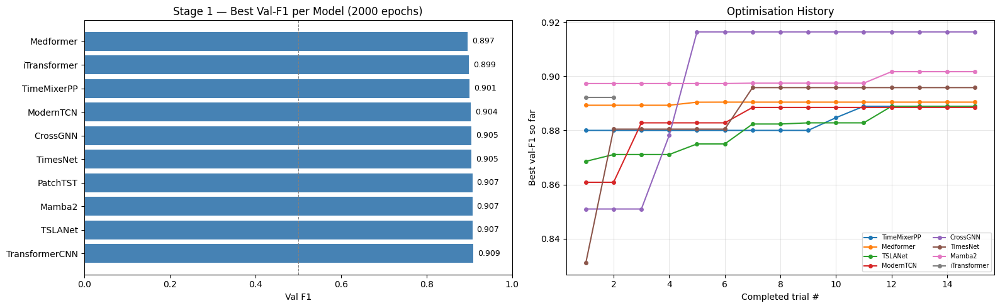

Figure saved → Save_model_HR_2000epoch/optuna_stage1_results.png


In [11]:
# ── Visualisation ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

ax = axes[0]
colors = ['steelblue' if v >= 0.5 else 'salmon' for v in df['val_f1'].fillna(0)]
ax.barh(df['model'], df['val_f1'].fillna(0), color=colors)
ax.axvline(0.5, color='gray', linestyle='--', linewidth=0.8)
ax.set_xlabel('Val F1')
ax.set_title('Stage 1 — Best Val-F1 per Model (2000 epochs)')
ax.set_xlim(0, 1)
for i, (_, row) in enumerate(df.iterrows()):
    ax.text(row['val_f1'] + 0.01 if not pd.isna(row['val_f1']) else 0.01,
            i, f"{row['val_f1']:.3f}" if not pd.isna(row['val_f1']) else 'N/A',
            va='center', fontsize=9)

ax2 = axes[1]
for model_name in MODELS:
    study_name = f'stage1_2000ep_{model_name}'
    try:
        study = optuna.load_study(study_name=study_name, storage=STORAGE)
        completed = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]
        if completed:
            vals = [t.value for t in completed]
            best_so_far = [max(vals[:i+1]) for i in range(len(vals))]
            ax2.plot(range(1, len(best_so_far) + 1), best_so_far,
                     marker='o', markersize=4, label=model_name)
    except Exception:
        pass
ax2.set_xlabel('Completed trial #')
ax2.set_ylabel('Best val-F1 so far')
ax2.set_title('Optimisation History')
ax2.legend(fontsize=7, ncol=2)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
fig_path = SAVE_DIR / 'optuna_stage1_results.png'
plt.savefig(fig_path, dpi=150)
plt.show()
print(f'Figure saved → {fig_path}')

In [12]:
# ── Stage 1 Summary / Comparison Artifacts ───────────────────────────────────
import importlib
import HR_optuna_utils as ou
ou = importlib.reload(ou)

summary_df      = ou.generate_stage1_summary(study_results, e4_results_all, SAVE_DIR)
per_subject_df  = ou.save_per_subject_results(e4_results_all, SAVE_DIR)

print('\n=== Stage 1 Summary (sorted by E4 F1) ===')
try:
    display(
        summary_df[['model', 'status', 'best_val_f1', 'e4_f1', 'e4_accuracy',
                    'e4_precision', 'e4_recall', 'e4_auroc',
                    'n_trials_completed', 'n_trials_pruned']]
        .style
        .format({c: '{:.4f}' for c in ['best_val_f1', 'e4_f1', 'e4_accuracy',
                                       'e4_precision', 'e4_recall', 'e4_auroc']},
                na_rep='N/A')
        .background_gradient(cmap='YlGn', subset=['best_val_f1', 'e4_f1'])
    )
except Exception:
    print(summary_df)

summary_json_path = SAVE_DIR / 'stage1_summary.json'
summary_df.to_json(summary_json_path, orient='records', indent=2)
print(f'Saved: {summary_json_path}')

Saved: Save_model_HR_2000epoch/stage1_summary.csv
Saved: Save_model_HR_2000epoch/stage1_per_subject.csv

=== Stage 1 Summary (sorted by E4 F1) ===


,model,status,best_val_f1,e4_f1,e4_accuracy,e4_precision,e4_recall,e4_auroc,n_trials_completed,n_trials_pruned
0,Mamba2,OK,0.9072,0.9544,0.9147,0.9200,0.9914,0.7054,15,0
1,CrossGNN,OK,0.9049,0.9428,0.8953,0.9277,0.9583,0.6509,15,0
2,PatchTST,OK,0.9072,0.9427,0.8941,0.9183,0.9684,0.7104,15,0
3,Medformer,OK,0.8966,0.9416,0.8902,0.9025,0.9842,0.6306,15,0
4,iTransformer,OK,0.8993,0.9374,0.8850,0.9186,0.9569,0.6595,15,0
5,TransformerCNN,OK,0.9094,0.9367,0.8837,0.9174,0.9569,0.6421,15,0
6,ModernTCN,OK,0.9039,0.9364,0.8837,0.9220,0.9511,0.6753,15,0
7,TSLANet,OK,0.9072,0.9346,0.8798,0.9159,0.9540,0.6837,15,0
8,TimesNet,OK,0.9052,0.9275,0.8682,0.9183,0.9368,0.6766,15,0
9,TimeMixerPP,OK,0.9005,0.9136,0.8463,0.9236,0.9037,0.6657,15,0


Saved: Save_model_HR_2000epoch/stage1_summary.json


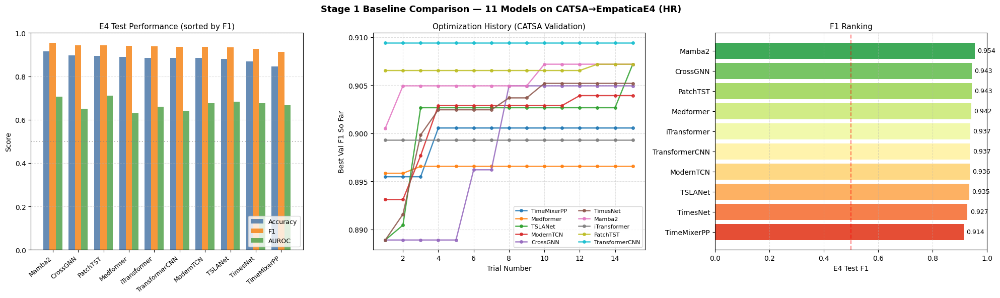

Saved: Save_model_HR_2000epoch/stage1_comparison.png


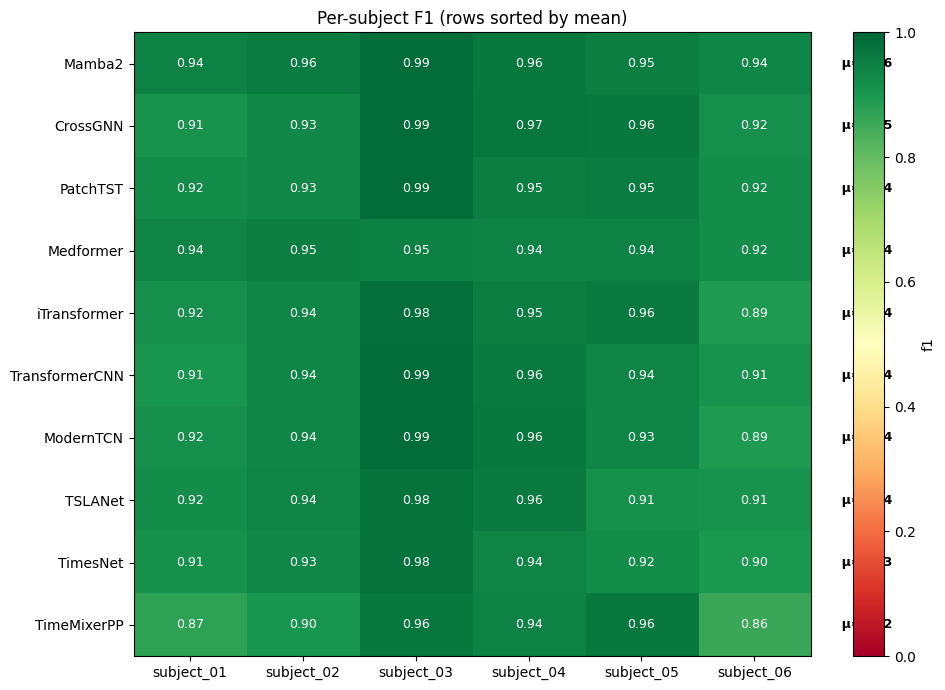

Saved: Save_model_HR_2000epoch/stage1_per_subject_heatmap_f1.png
Plots saved to: Save_model_HR_2000epoch/optuna_results

Comparison artifacts generated.


In [13]:
# ── Stage 1 Comparison Figures ────────────────────────────────────────────────
ou.plot_stage1_comparison(summary_df, study_results, SAVE_DIR, signal_name=SIGNAL)
ou.plot_per_subject_heatmap(per_subject_df, SAVE_DIR, metric='f1')
ou.save_hp_importance_plots(study_results, SAVE_DIR)

print('\nComparison artifacts generated.')

In [14]:
# ── Best HPs per model (saved as JSON) ───────────────────────────────────────
best_hp_all: dict[str, dict] = {}
for model_name in MODELS:
    study_name = f'stage1_2000ep_{model_name}'
    try:
        study = optuna.load_study(study_name=study_name, storage=STORAGE)
        completed = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]
        if completed:
            best_trial = max(completed, key=lambda t: t.value)
            best_hp_all[model_name] = best_trial.params
    except Exception:
        pass

hp_json_path = SAVE_DIR / 'best_hp_stage1.json'
with open(hp_json_path, 'w') as f:
    json.dump(best_hp_all, f, indent=2)
print(f'Best HPs saved → {hp_json_path}')
for m, hp in best_hp_all.items():
    print(f'  {m:<16s}: {hp}')

Best HPs saved → Save_model_HR_2000epoch/best_hp_stage1.json
  TimeMixerPP     : {'lr': 0.006082943902148001, 'wd': 0.0002752269890740978, 'dropout': 0.08066889307896194, 'bs': 32, 'd_model': 128, 'n_blocks': 4, 'k_periods': 2, 'n_heads': 2}
  Medformer       : {'lr': 0.003561265260858927, 'wd': 0.00013998203605733984, 'dropout': 0.2924635834245487, 'bs': 128, 'd_model': 128, 'n_heads': 2, 'n_layers': 4}
  TSLANet         : {'lr': 0.008078994970704948, 'wd': 5.705511636776347e-05, 'dropout': 0.2848709609576791, 'bs': 32, 'd_model': 128, 'n_blocks': 2}
  ModernTCN       : {'lr': 0.0064793548502521175, 'wd': 2.5278229774836203e-05, 'dropout': 0.1861843554314279, 'bs': 128, 'd_model': 256, 'n_blocks': 1}
  CrossGNN        : {'lr': 0.006868392642993724, 'wd': 0.0004156863159696907, 'dropout': 0.3835897146352266, 'bs': 32, 'd_model': 64, 'n_layers': 3}
  TimesNet        : {'lr': 0.005720524538122035, 'wd': 0.005902510927387434, 'dropout': 0.26848938543983186, 'bs': 128, 'd_model': 64, 'n_bl

In [15]:
# ── Final Stage 1 Report ──────────────────────────────────────────────────────
print('\n' + '=' * 72)
print('STAGE 1 BASELINE RESULTS  (2000 epochs, no early stopping)')
print('=' * 72)

valid = summary_df.dropna(subset=['e4_f1']).copy()
if len(valid) > 0:
    print('\nTop 3 models by E4 F1:')
    for rank, (_, row) in enumerate(valid.head(3).iterrows(), start=1):
        print(f"  {rank}. {row['model']:15s} | E4 F1: {row['e4_f1']:.4f} | Val F1: {row['best_val_f1']:.4f}")

    best_row = valid.iloc[0]
    print(f"\nBest model: {best_row['model']}")
    print(f"  Best HPs: lr={best_row['best_lr']:.2e}, bs={int(best_row['best_batch_size'])}, dropout={best_row['best_dropout']:.2f}")
    print(f"  Weight decay={best_row['best_weight_decay']:.2e}, focal_gamma={best_row['best_focal_gamma']}")
    print(f"  Model-specific: {best_row['best_model_specific']}")
    print(f"  E4 metrics: F1={best_row['e4_f1']:.4f}, Acc={best_row['e4_accuracy']:.4f}, AUROC={best_row['e4_auroc']:.4f}")

failed = summary_df[summary_df['status'] == 'FAILED']
if len(failed) > 0:
    print(f"\nFailed models: {failed['model'].tolist()}")

print('\nSaved outputs:')
print(f"  {SAVE_DIR / 'stage1_summary.csv'}")
print(f"  {SAVE_DIR / 'stage1_per_subject.csv'}")
print(f"  {SAVE_DIR / 'stage1_comparison.png'}")
print(f"  {SAVE_DIR / 'stage1_per_subject_heatmap_f1.png'}")
print(f"  {SAVE_DIR / 'optuna_results'}")
print('=' * 72)


STAGE 1 BASELINE RESULTS  (2000 epochs, no early stopping)

Top 3 models by E4 F1:
  1. Mamba2          | E4 F1: 0.9544 | Val F1: 0.9072
  2. CrossGNN        | E4 F1: 0.9428 | Val F1: 0.9049
  3. PatchTST        | E4 F1: 0.9427 | Val F1: 0.9072

Best model: Mamba2
  Best HPs: lr=1.13e-04, bs=32, dropout=0.06
  Weight decay=5.14e-05, focal_gamma=2.0
  Model-specific: {"patience": 100, "d_model": 128, "d_state": 8, "n_layers": 5}
  E4 metrics: F1=0.9544, Acc=0.9147, AUROC=0.7054

Saved outputs:
  Save_model_HR_2000epoch/stage1_summary.csv
  Save_model_HR_2000epoch/stage1_per_subject.csv
  Save_model_HR_2000epoch/stage1_comparison.png
  Save_model_HR_2000epoch/stage1_per_subject_heatmap_f1.png
  Save_model_HR_2000epoch/optuna_results
